<a href="https://colab.research.google.com/github/douglasmmachado/MedicineConsumption/blob/time_series/notebooks/unified_approach/3_Feature_Manipulation_and_Comprehension_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 3 - Understanding feautures and selecting the most important ones regarding the consumption



---



---



In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import math as m

from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas import Series

from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error,  mean_absolute_percentage_error
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.utils import shuffle
from sklearn.model_selection import GridSearchCV


df_url ="https://raw.githubusercontent.com/douglasmmachado/ExploratoryDataAnalysis/time_series/datasets/unified_approach/df_resampled_filled.csv"

df = pd.read_csv(df_url)

medicines = [3400892088310,3400892075761,3400892203645,
             3400892065366,3400892052120,3400891996128,
             3400893826706,3400893736135,3400893875490,
             3400890837149,3400891235203,3400891225037,
             3400891191226,3400892729589,3400892745848,
             3400892697789,3400892761527,3400893022634,
             3400892761695,3400892669236,3400892508566]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6636 entries, 0 to 6635
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID_SITE_RATTACHE  6636 non-null   object 
 1   HOSPI_CODE_UCD    6636 non-null   int64  
 2   QUANTITY          6636 non-null   float64
 3   N_UFS             6636 non-null   float64
 4   DATE              6636 non-null   object 
 5   N_ETB             6636 non-null   float64
 6   POPULATION        6636 non-null   float64
 7   P_MEDICAL         6636 non-null   float64
 8   PN_MEDICAL        6636 non-null   float64
 9   LIT_HC            6636 non-null   float64
 10  LIT_HP            6636 non-null   float64
 11  SEJ_MCO           6636 non-null   float64
 12  SEJ_HAD           6636 non-null   float64
 13  SEJ_PSY           6636 non-null   float64
 14  SEJ_SSR           6636 non-null   float64
 15  SEJ_SLD           6636 non-null   float64
dtypes: float64(13), int64(1), object(2)
memory

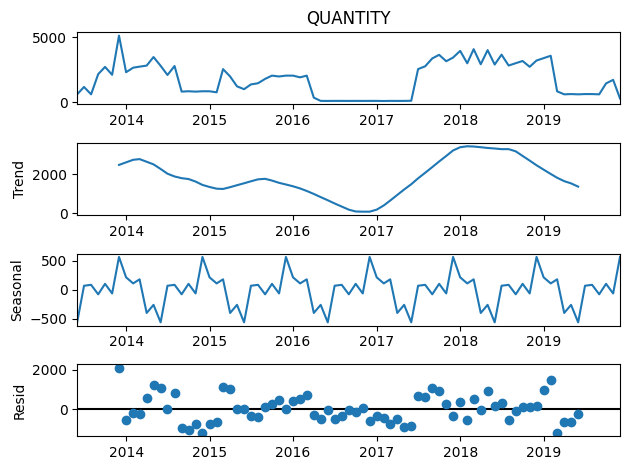

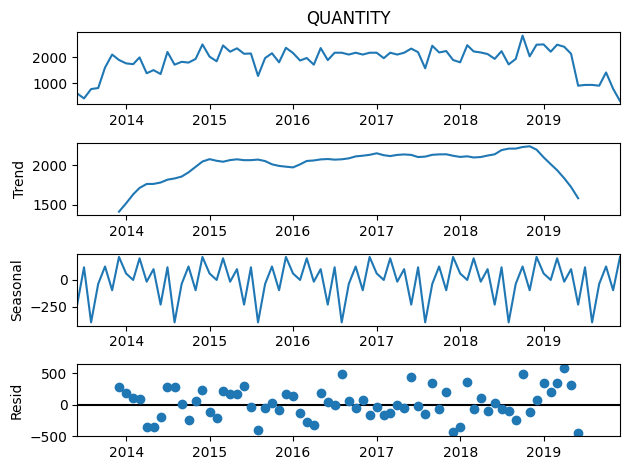

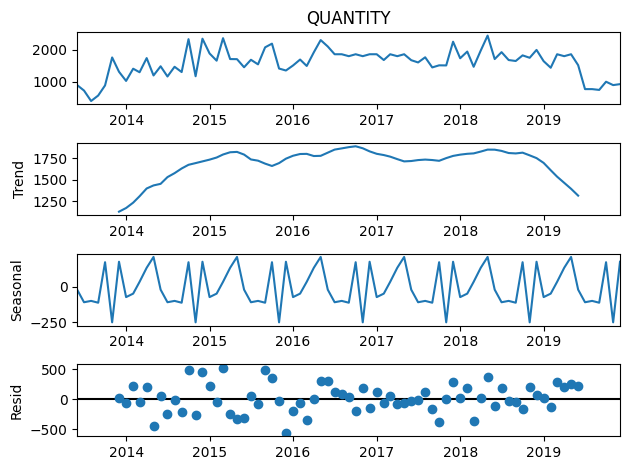

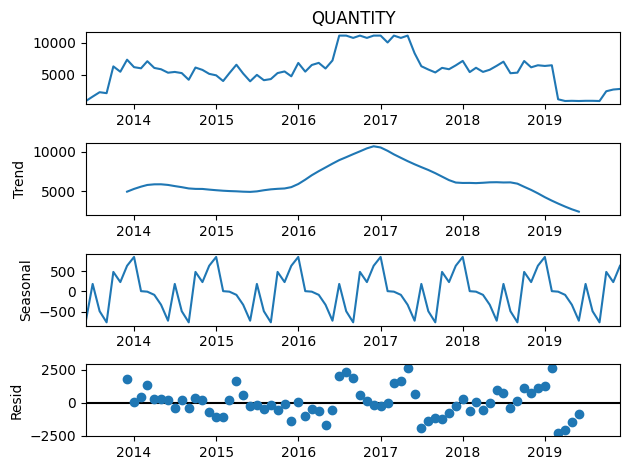

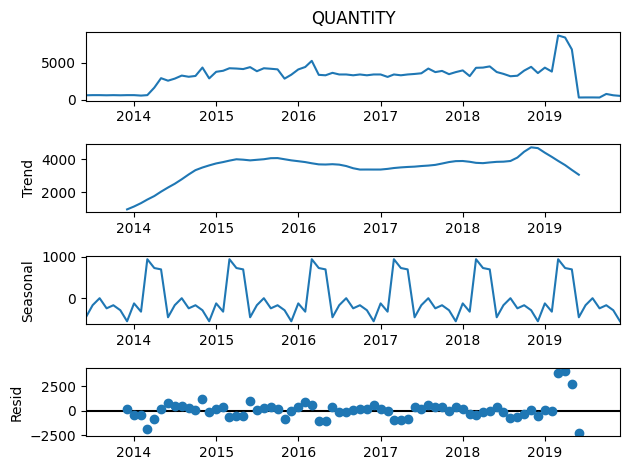

...

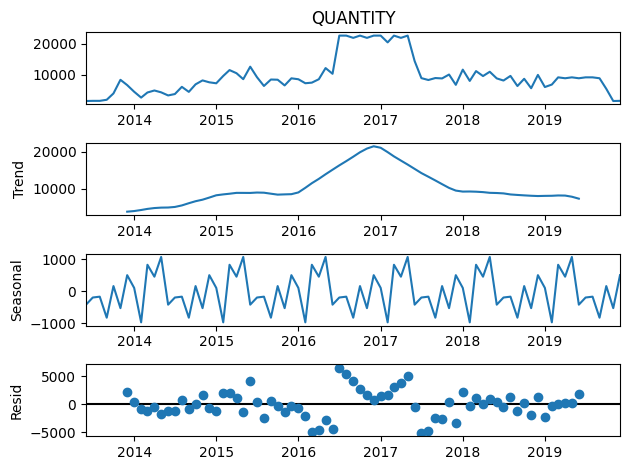

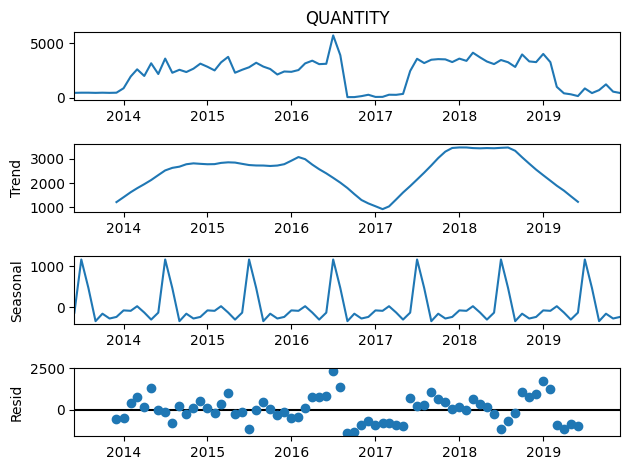

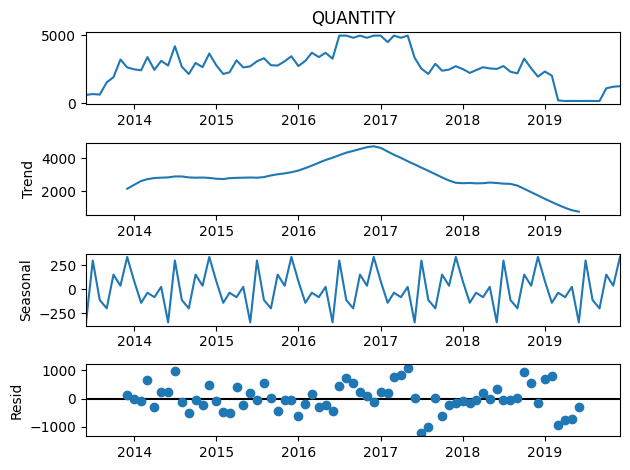

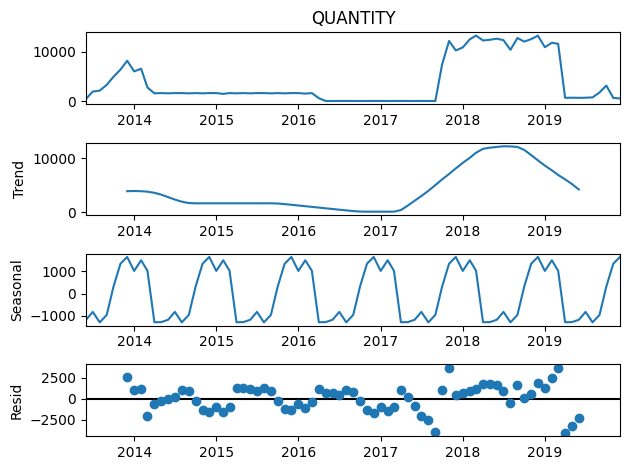

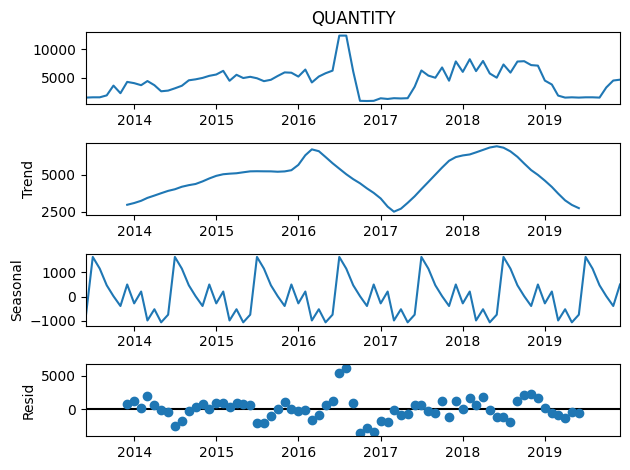

In [32]:
i = 0
for medicine in medicines:
  series = df[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == "HOSPI_1")]["QUANTITY"]
  series.index = pd.to_datetime(df[(df["HOSPI_CODE_UCD"] == medicines[i]) & (df["ID_SITE_RATTACHE"] == "HOSPI_1")]["DATE"])
  result = seasonal_decompose(series, model='additive')
  result.plot()
  plt.show()
  print()
  i += 1

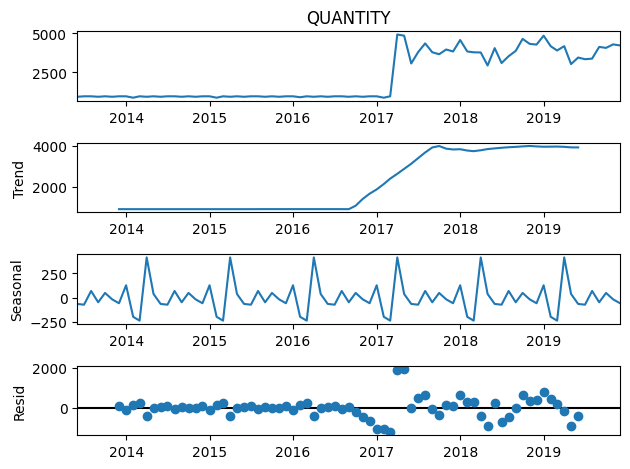

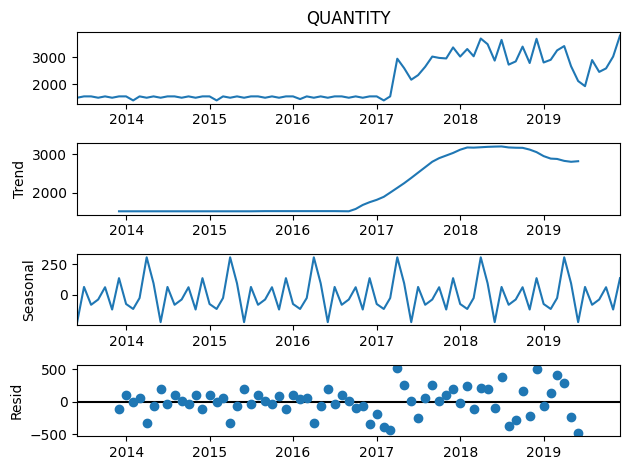

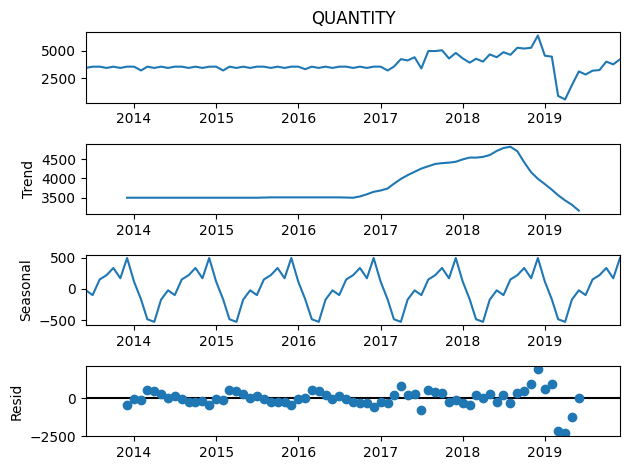

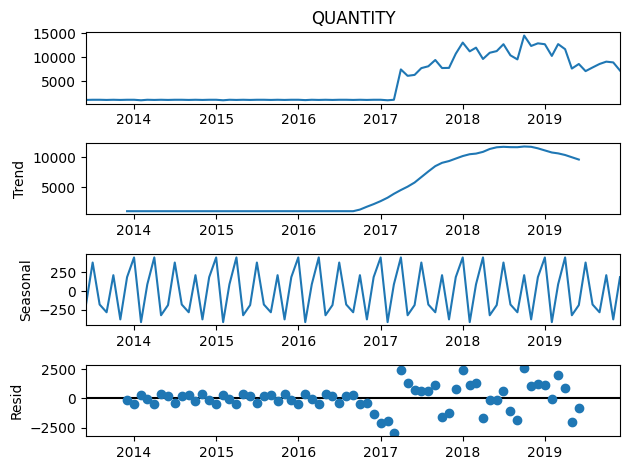

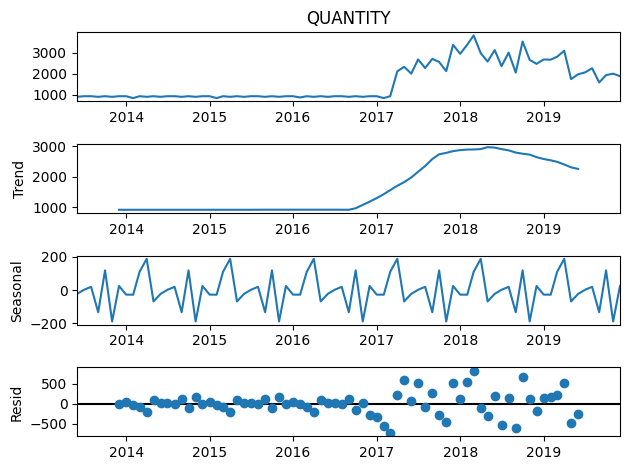

...

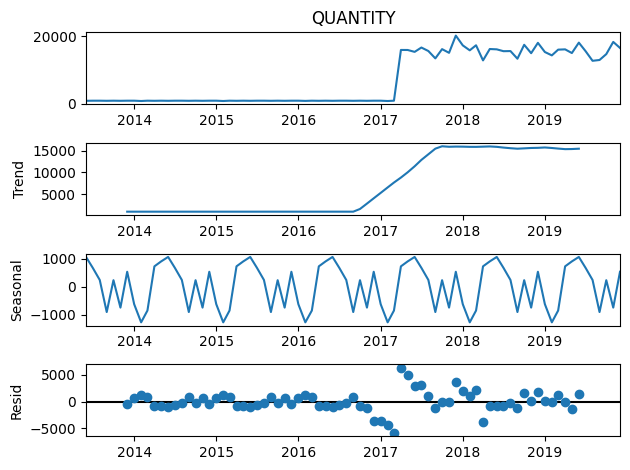

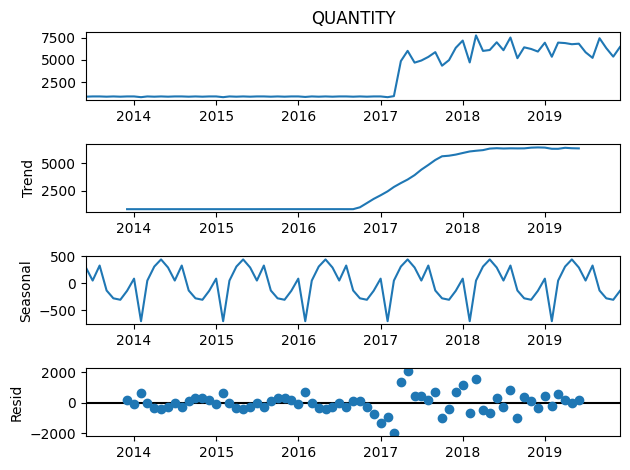

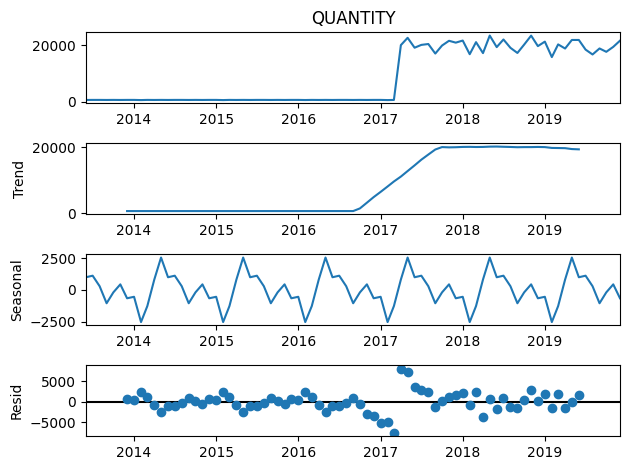

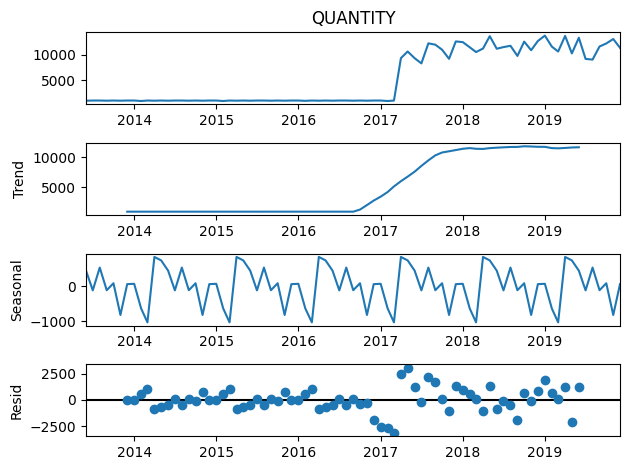

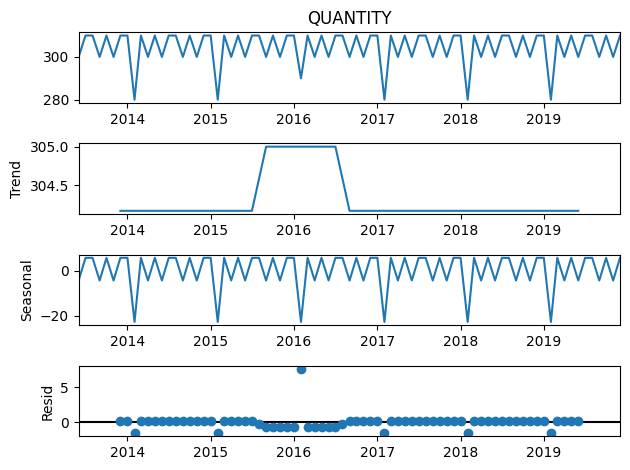

In [ ]:
i = 0
for medicine in medicines:
  series = df[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == "HOSPI_2")]["QUANTITY"]
  series.index = pd.to_datetime(df[(df["HOSPI_CODE_UCD"] == medicines[i]) & (df["ID_SITE_RATTACHE"] == "HOSPI_2")]["DATE"])
  result = seasonal_decompose(series, model='additive')
  result.plot()
  plt.show()
  print()
  i += 1

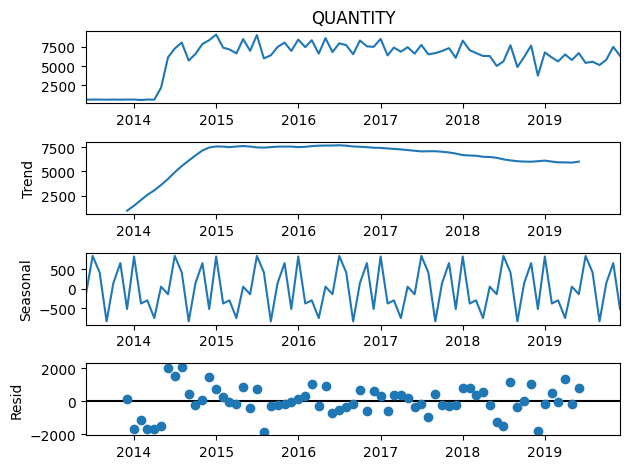

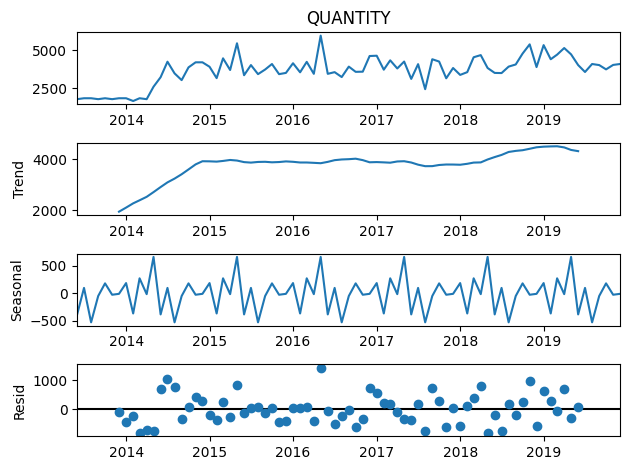

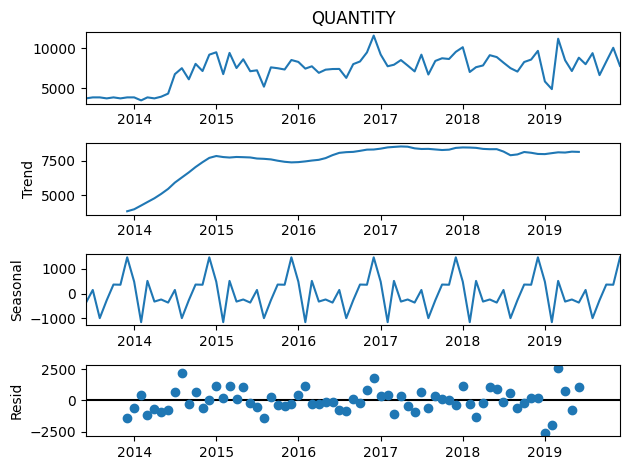

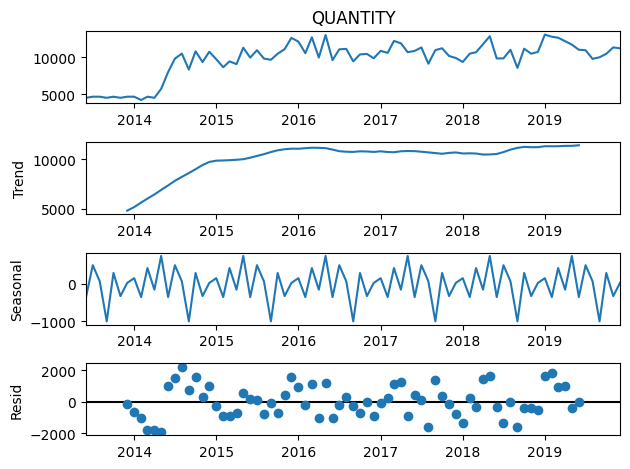

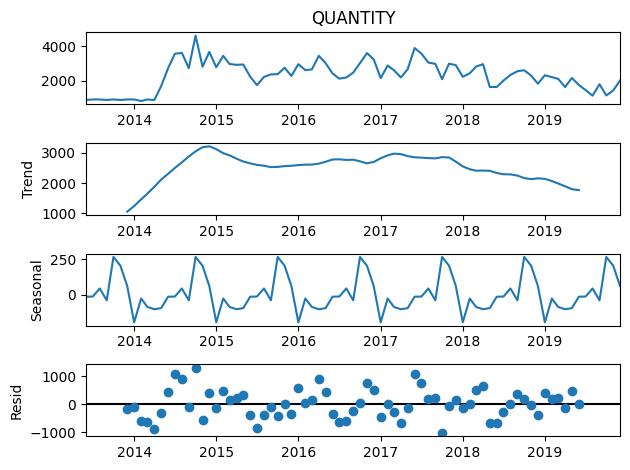

...

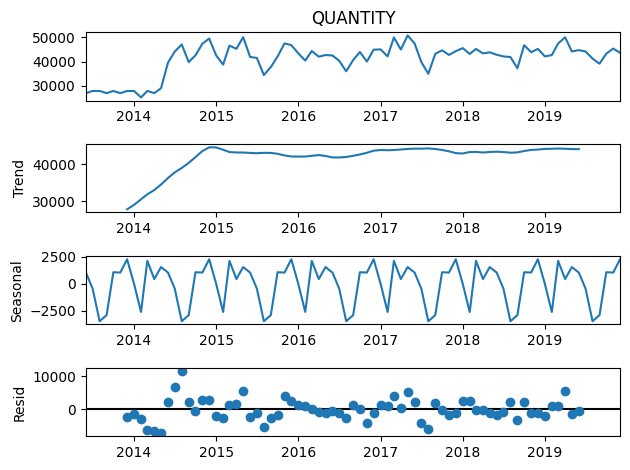

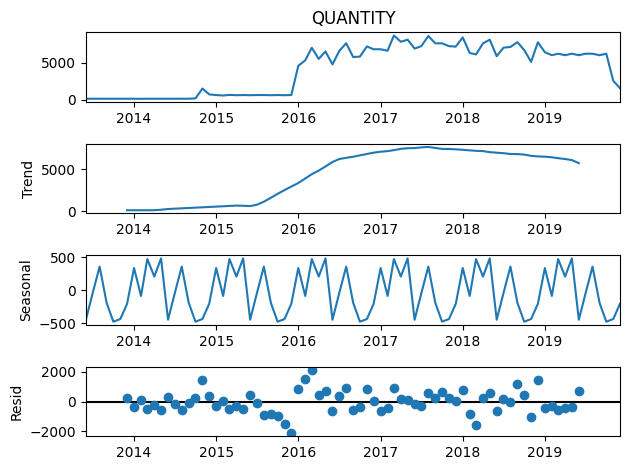

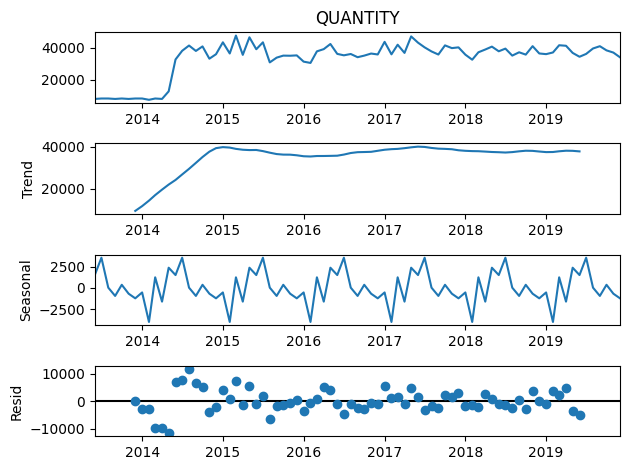

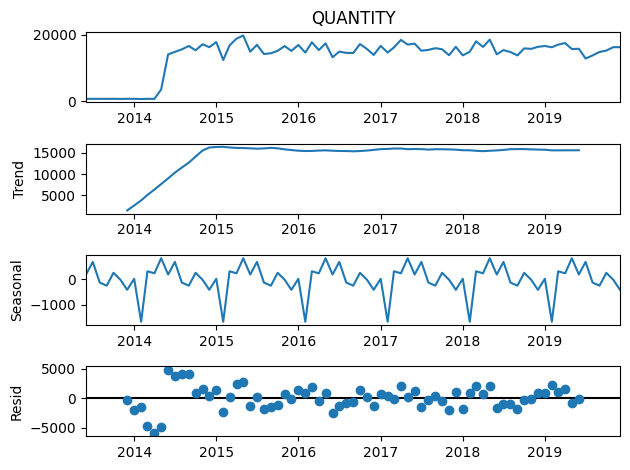

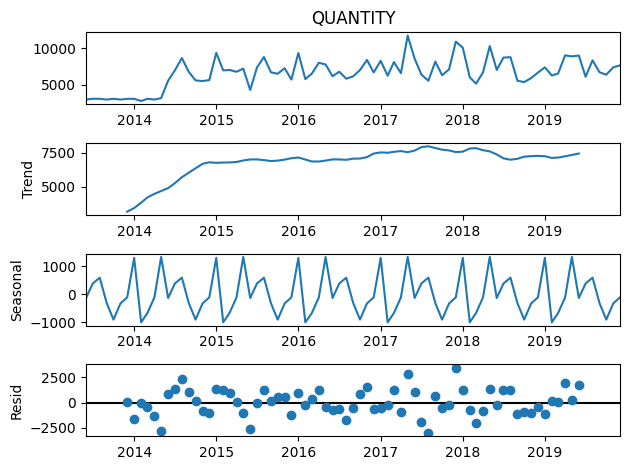

In [ ]:
i = 0
for medicine in medicines:
  series = df[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == "HOSPI_3")]["QUANTITY"]
  series.index = pd.to_datetime(df[(df["HOSPI_CODE_UCD"] == medicines[i]) & (df["ID_SITE_RATTACHE"] == "HOSPI_3")]["DATE"])
  result = seasonal_decompose(series, model='additive')
  result.plot()
  plt.show()
  print()
  i += 1

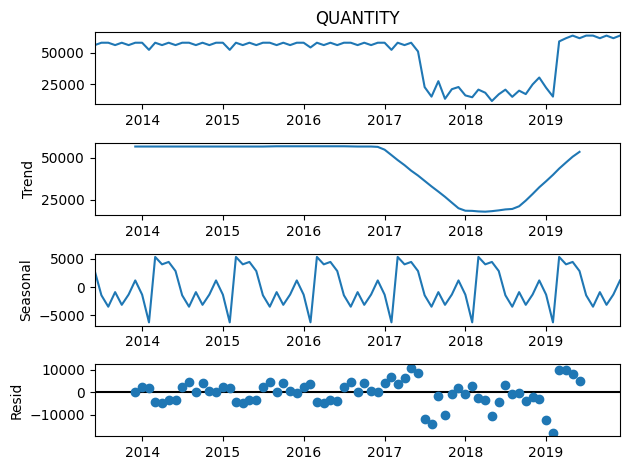

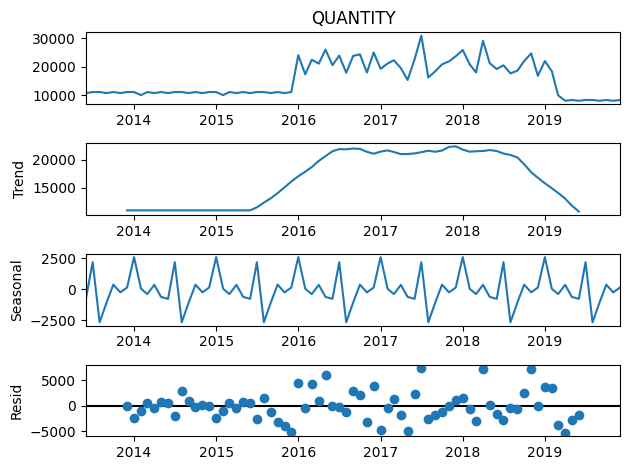

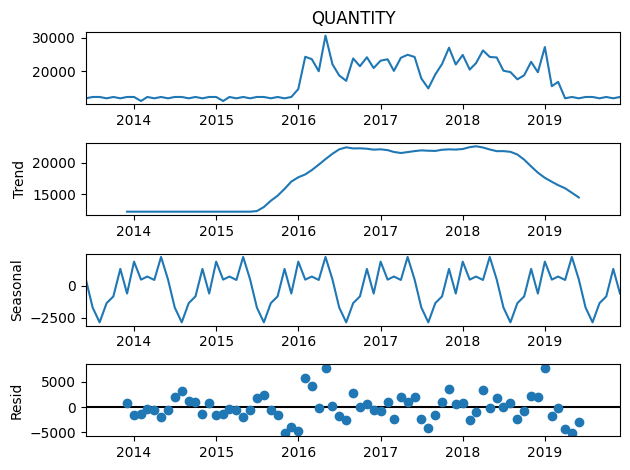

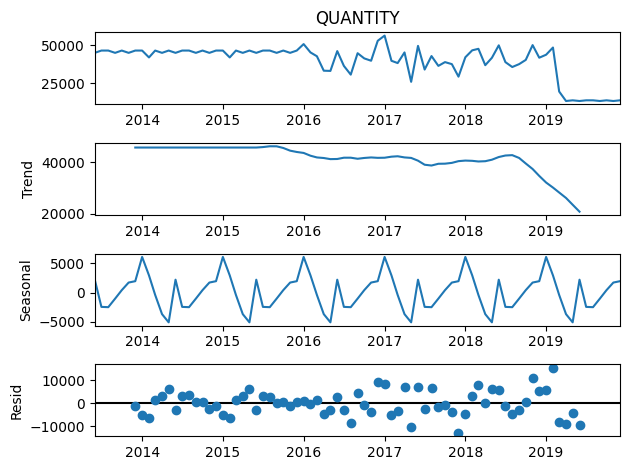

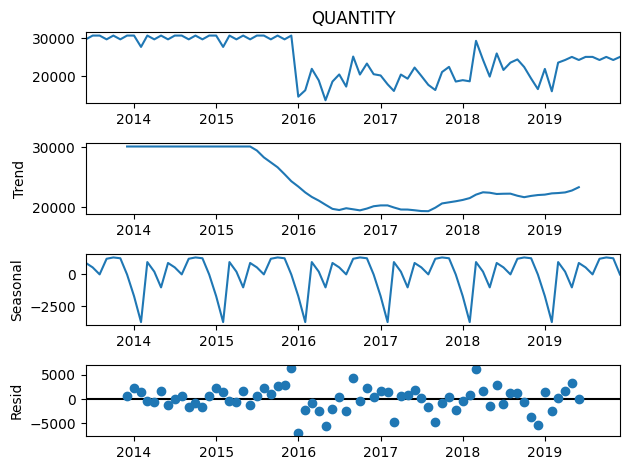

...

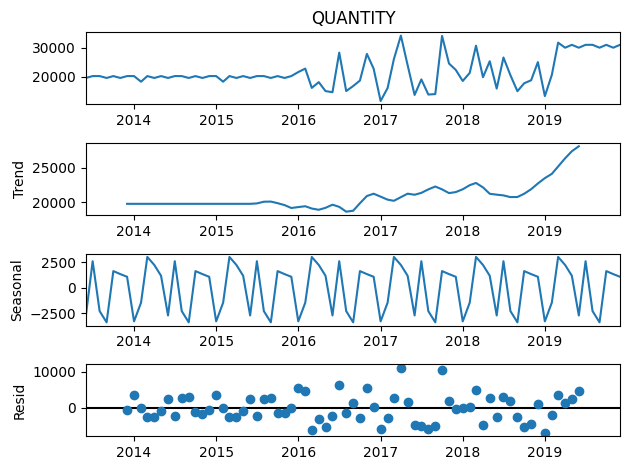

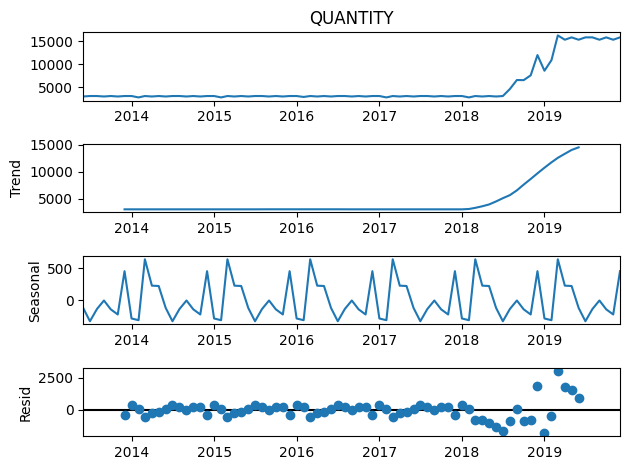

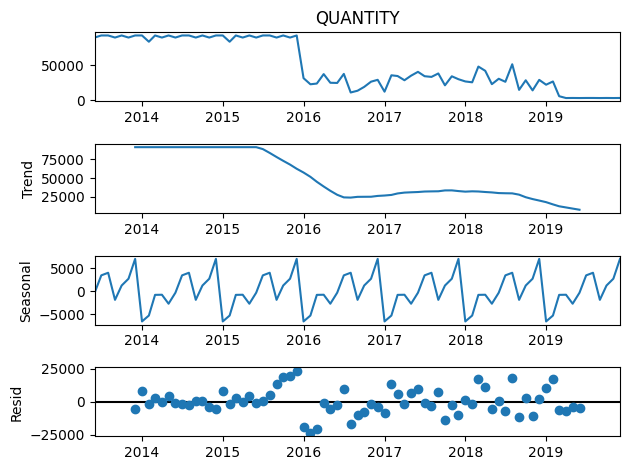

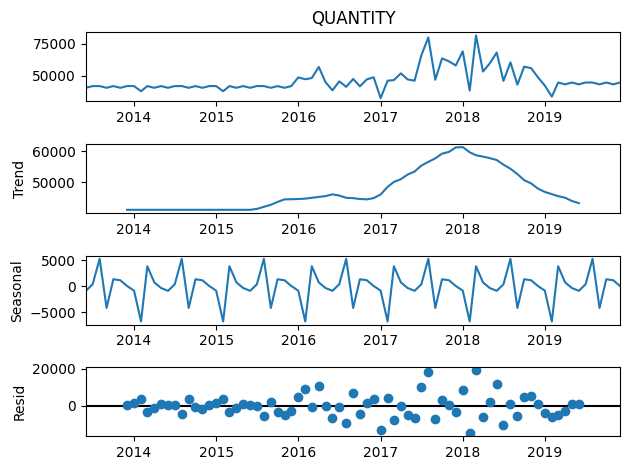

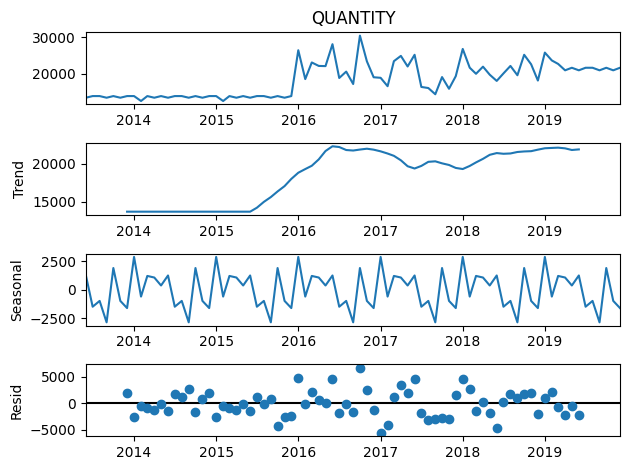

In [ ]:
i = 0
for medicine in medicines:
  series = df[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == "HOSPI_4")]["QUANTITY"]
  series.index = pd.to_datetime(df[(df["HOSPI_CODE_UCD"] == medicines[i]) & (df["ID_SITE_RATTACHE"] == "HOSPI_4")]["DATE"])
  result = seasonal_decompose(series, model='additive')
  result.plot()
  plt.show()
  print()
  i += 1

In [33]:
def ts_features(df):
    for hospital in df.ID_SITE_RATTACHE.unique():
        for medicine in medicines:
            series = df[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == hospital)]["QUANTITY"]
            series.index = pd.to_datetime(df[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == hospital)]["DATE"])
            result = seasonal_decompose(series, model='additive')
            df.loc[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == hospital), "TREND"] = result.trend.values
            df.loc[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == hospital), "SEASONAL"] = result.seasonal.values
            df.loc[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == hospital), "RESID"] = result.resid.values
    df.fillna(0, inplace=True)  # Replace NaN values with zero

In [34]:
ts_features(df)

In [ ]:
import matplotlib.dates as mdates

def plot_trend_over_time(df, medicines, column):
    for medicine in medicines:
        fig, ax = plt.subplots(figsize=(12, 6))
        for hospital in df.ID_SITE_RATTACHE.unique():
            subset = df[(df["HOSPI_CODE_UCD"] == medicine) & (df["ID_SITE_RATTACHE"] == hospital)]
            x = pd.to_datetime(subset["DATE"])
            y = subset[column]
            ax.plot(x, y, label=hospital)

        ax.set_xlabel('Date')
        ax.set_ylabel(column)
        ax.set_title(f'{column} over time for Medicine {medicine}')
        ax.legend()
        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.show()
        print()


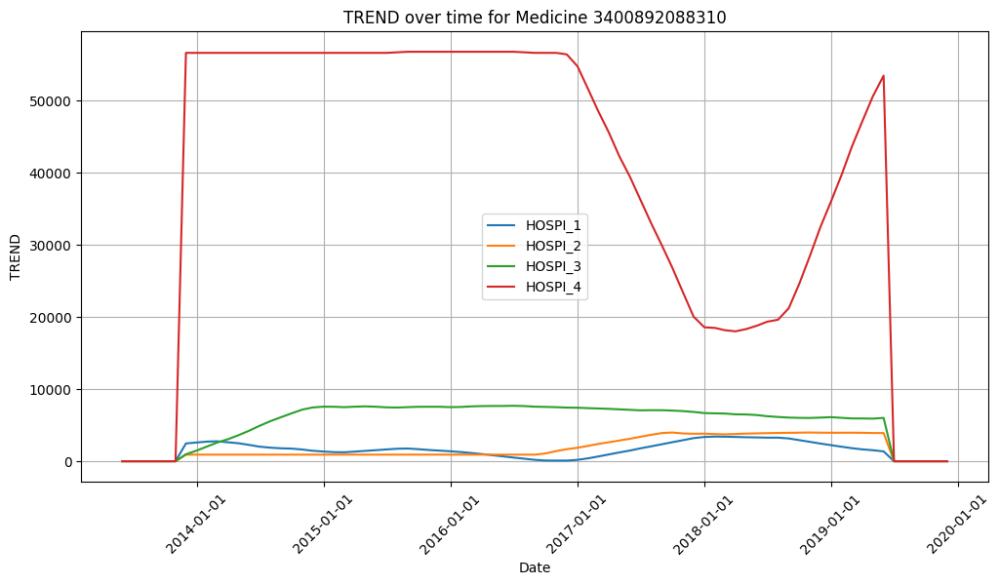

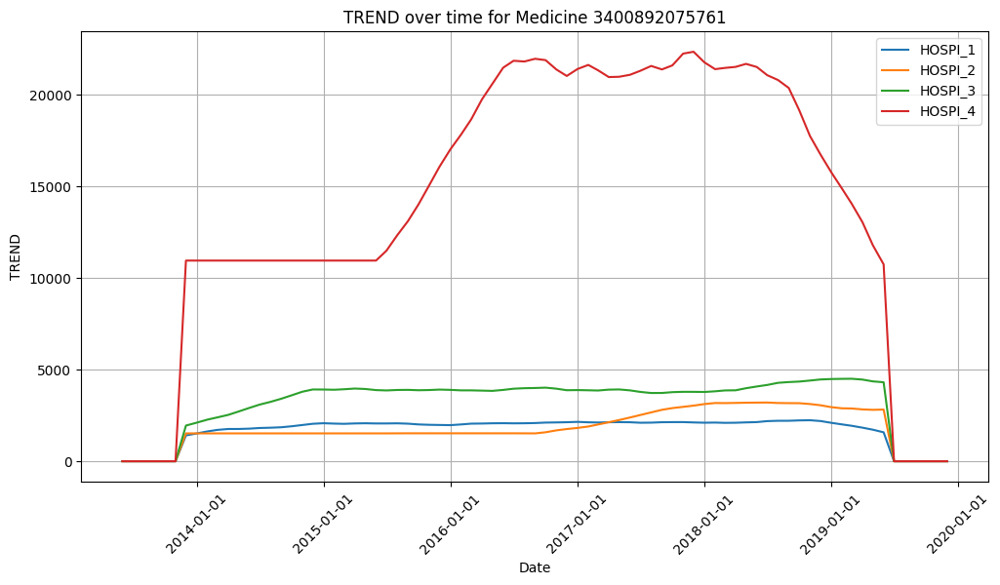

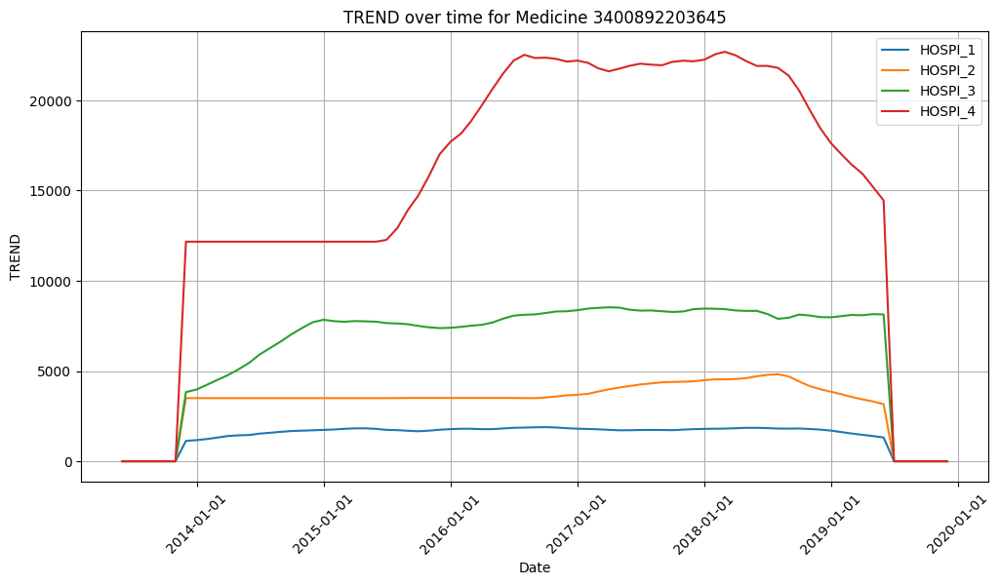

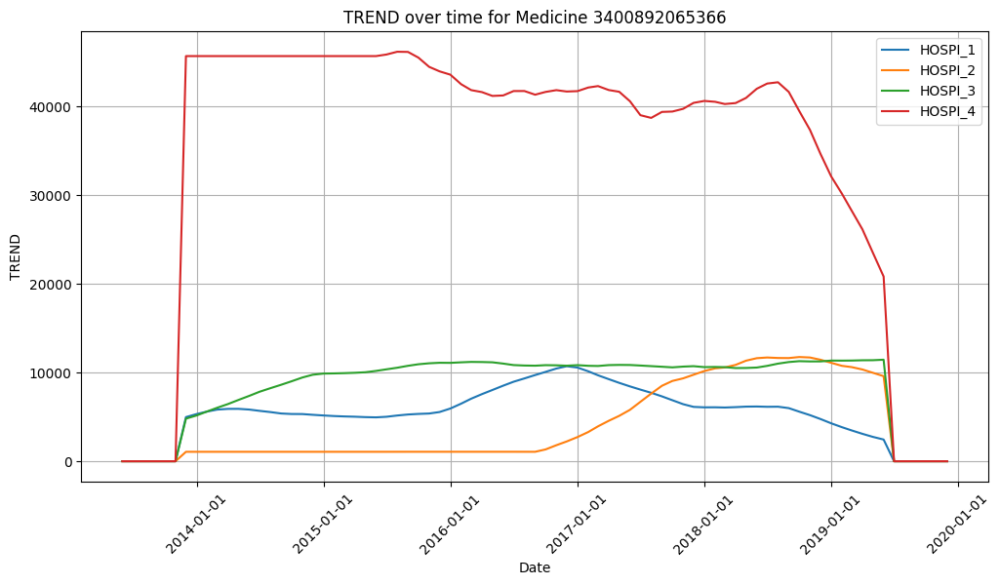

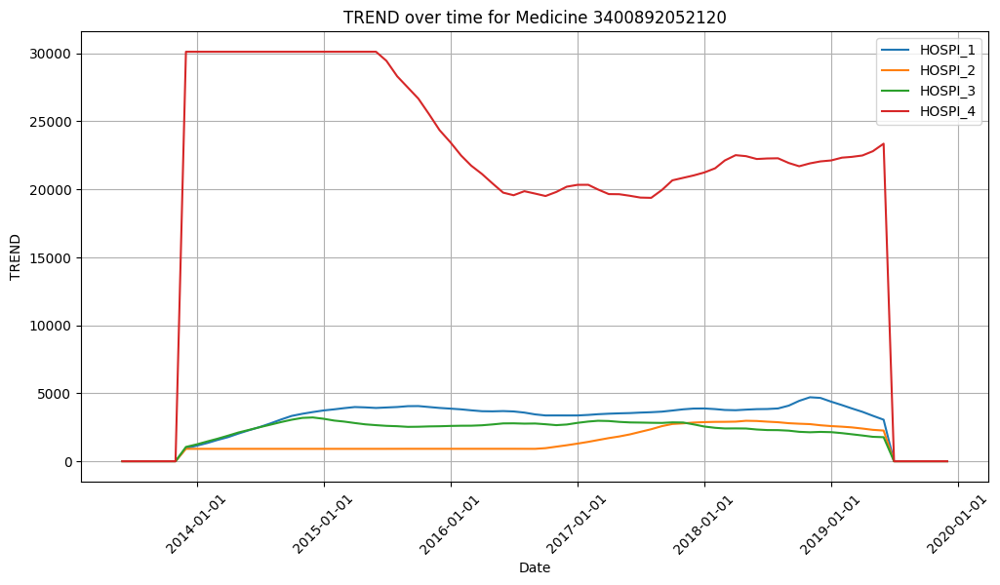

...

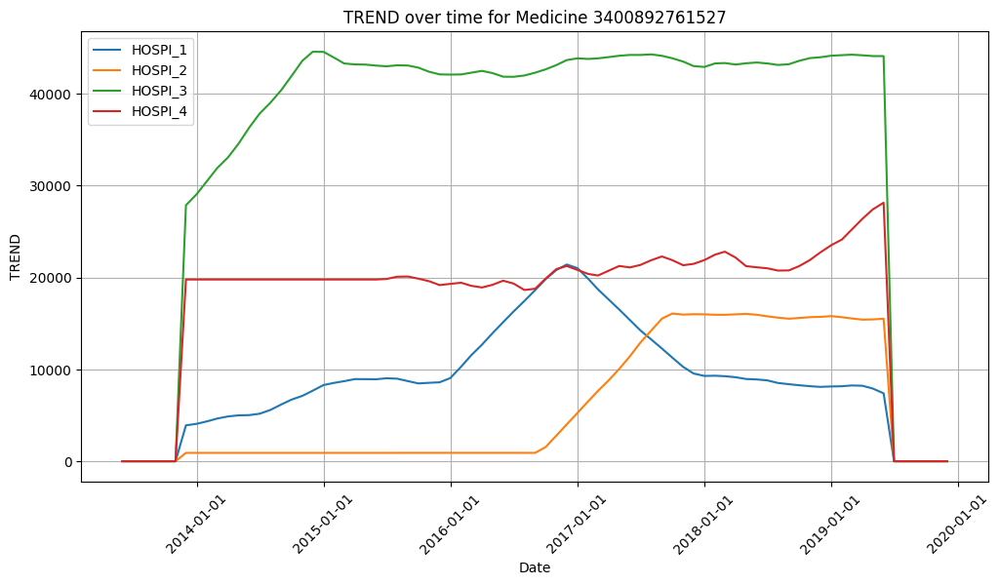

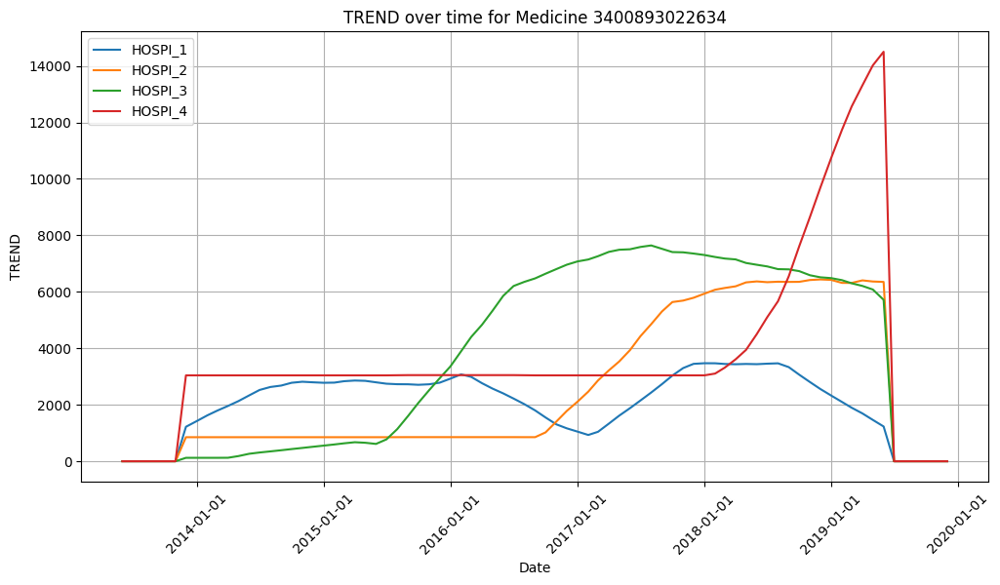

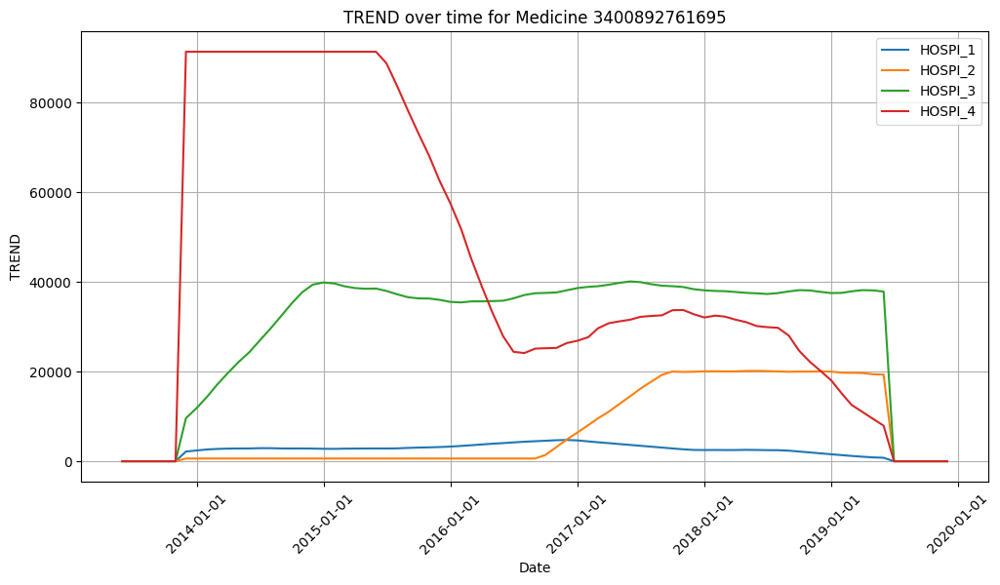

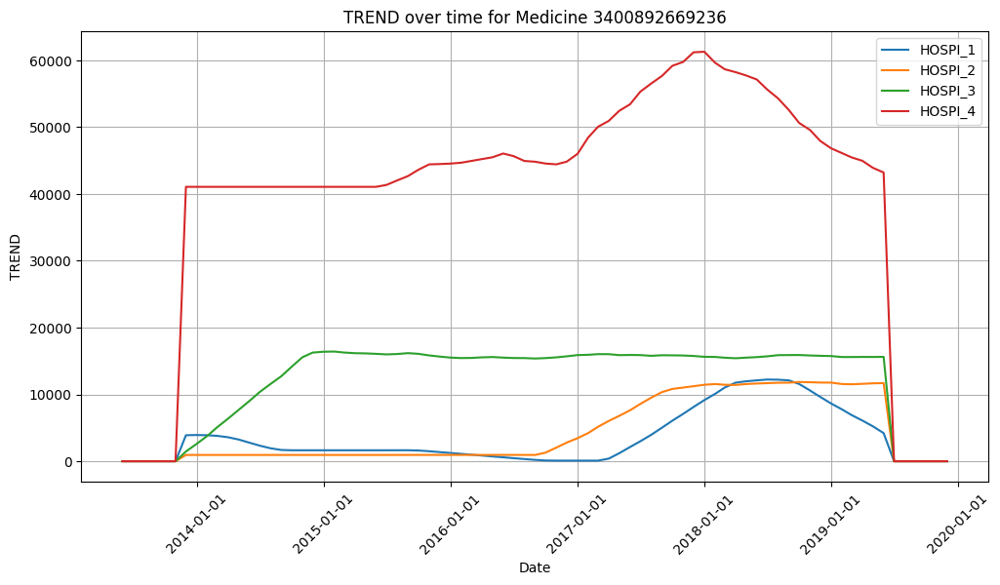

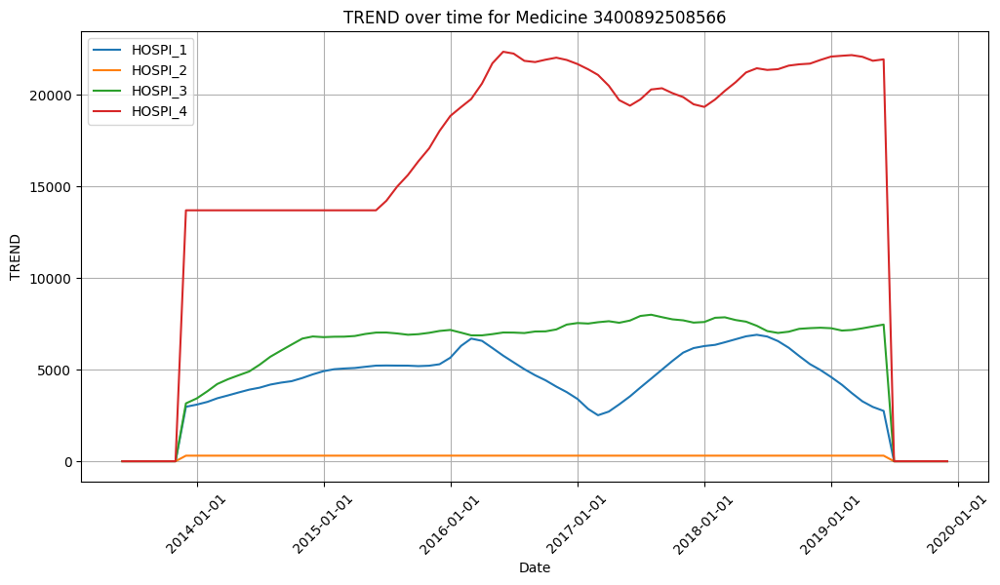

In [ ]:
plot_trend_over_time(df, medicines, "TREND")

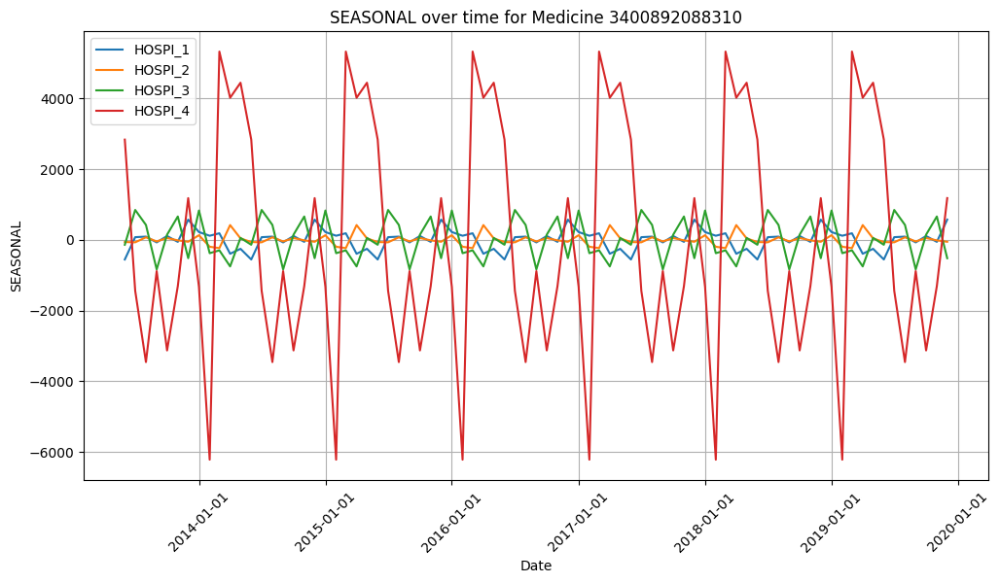

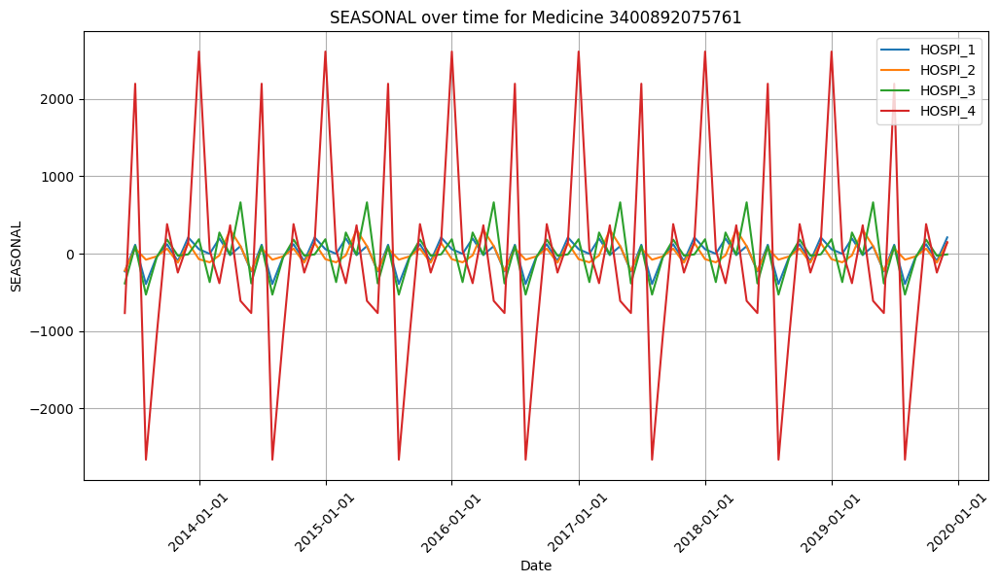

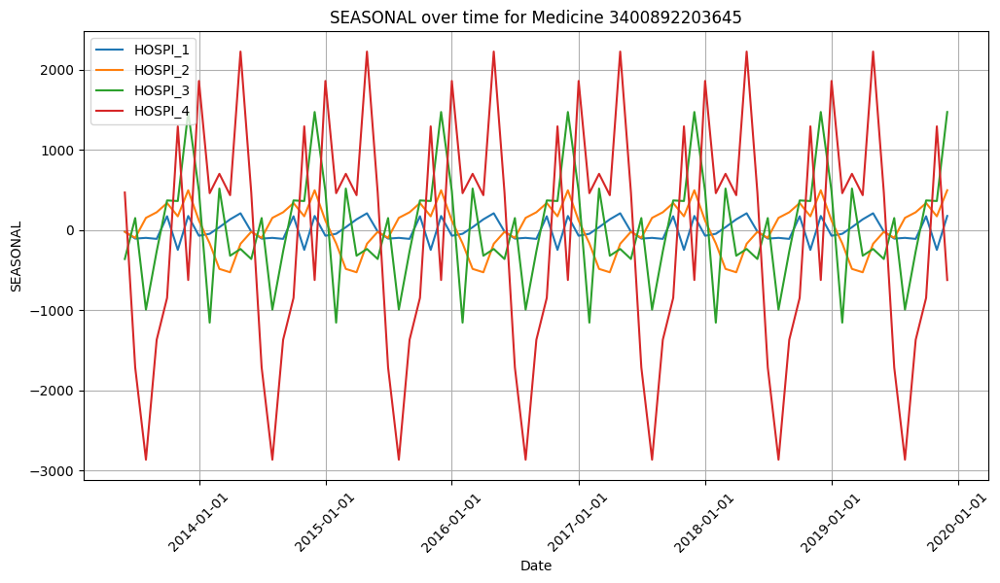

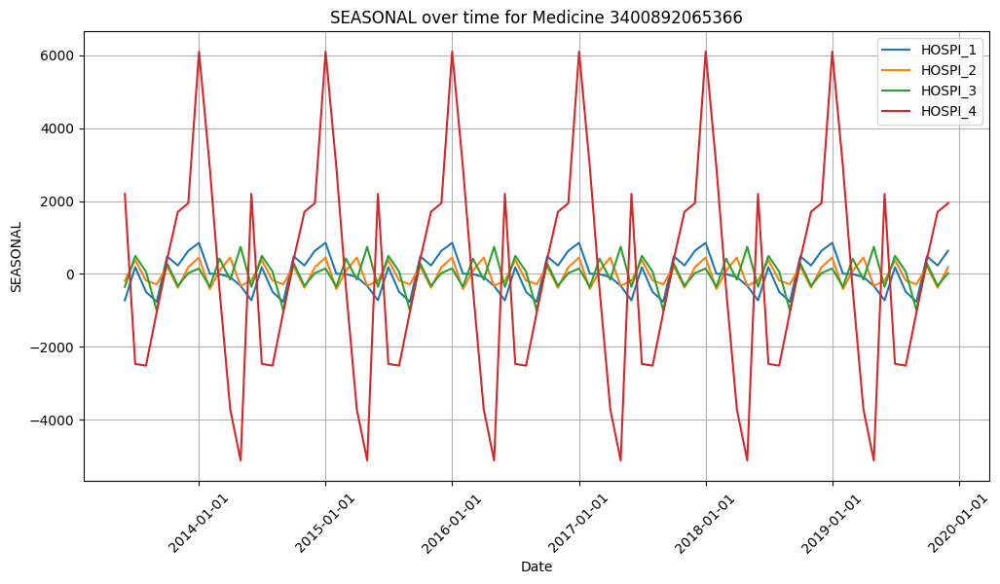

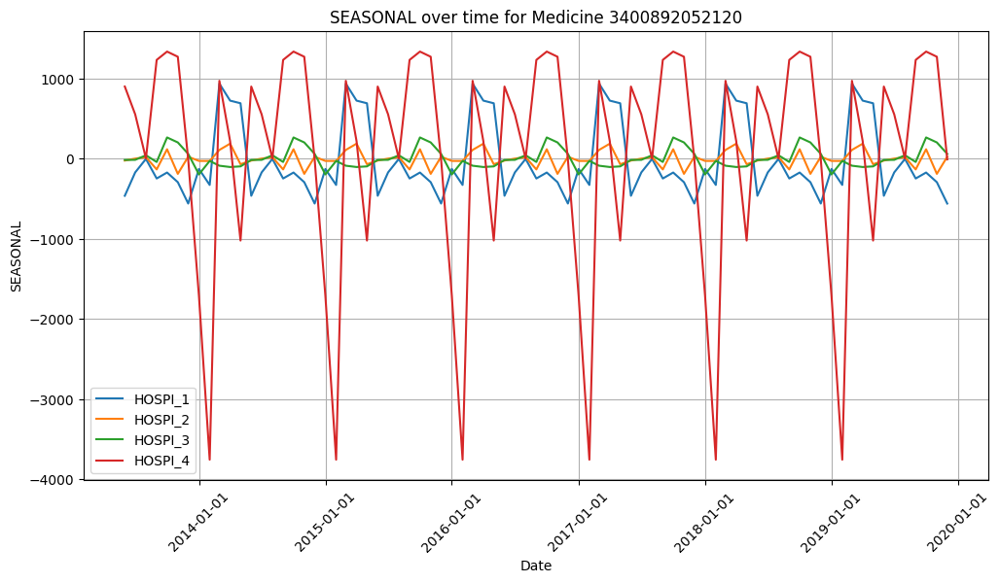

...

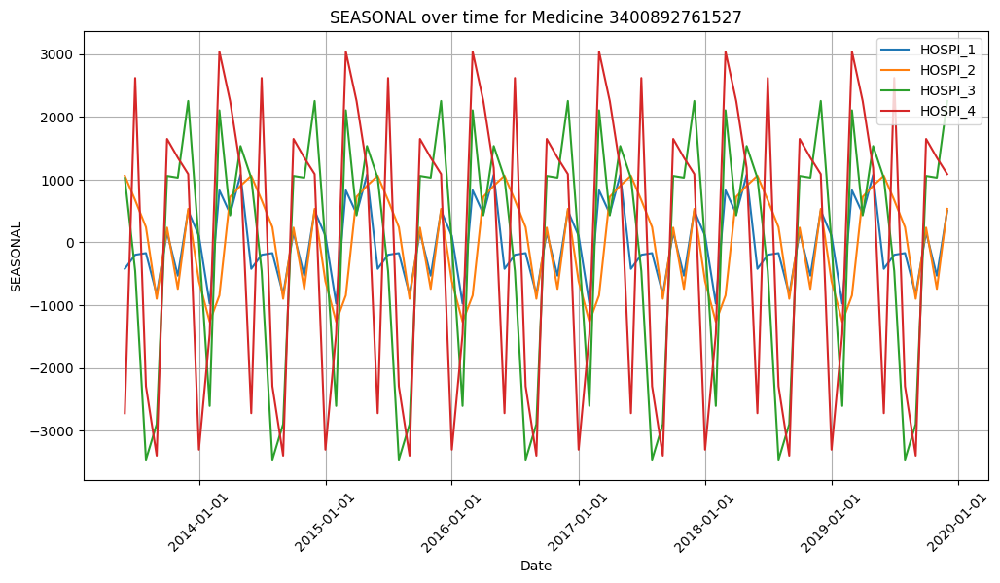

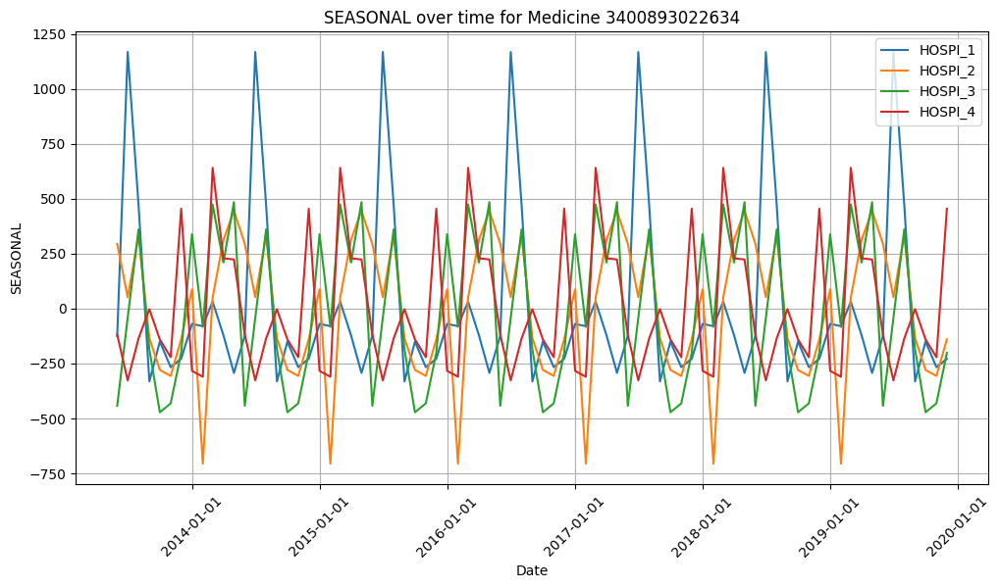

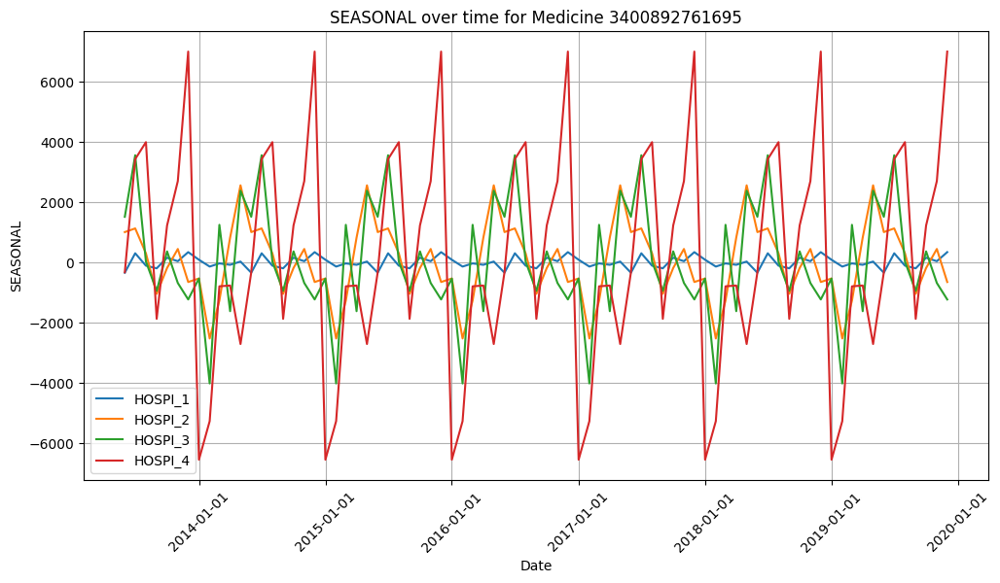

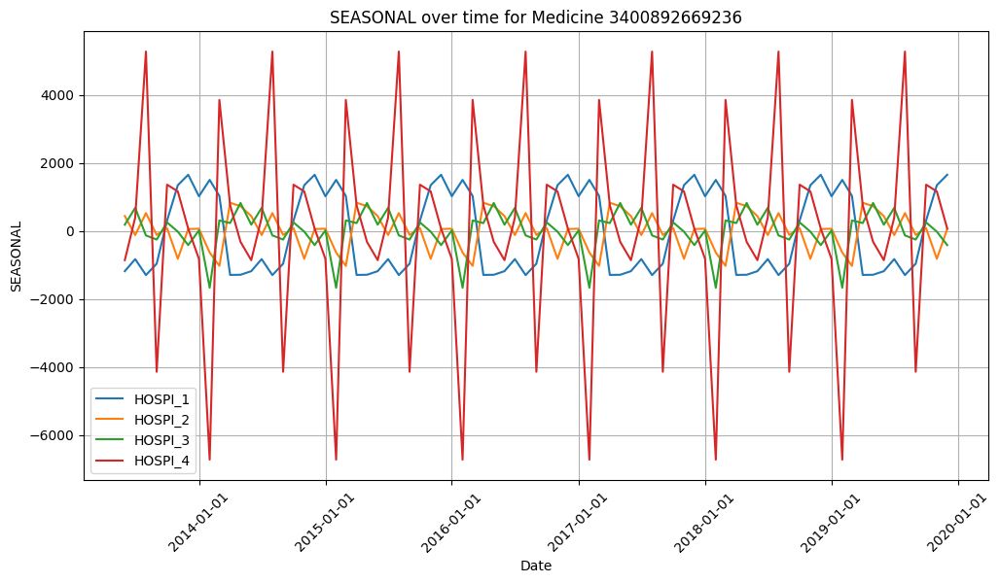

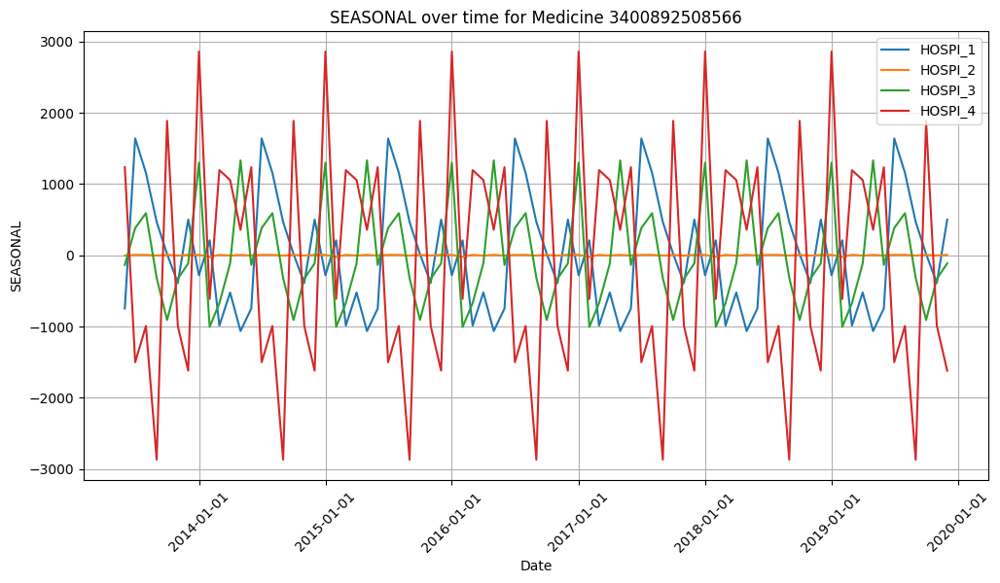

In [ ]:
plot_trend_over_time(df, medicines, "SEASONAL")

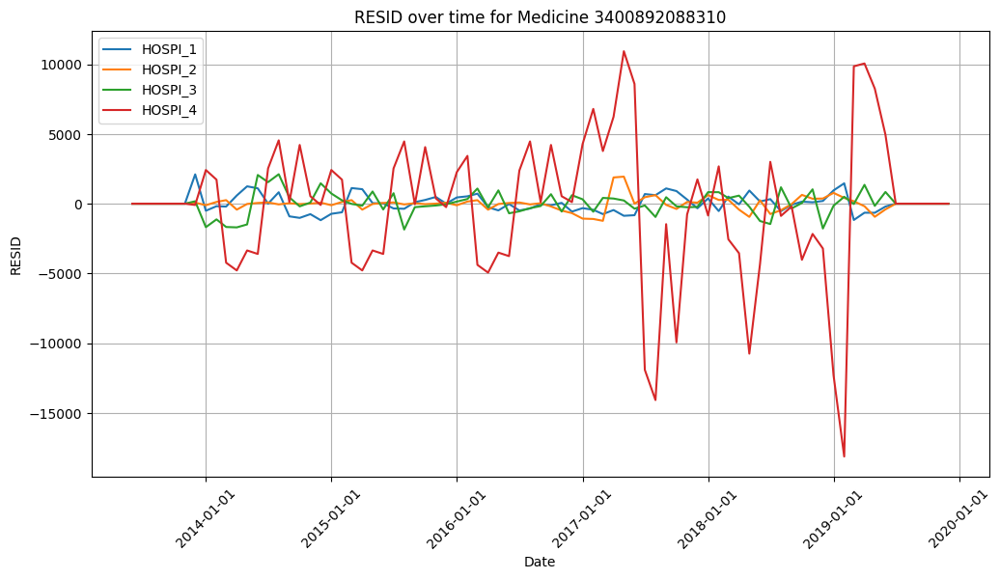

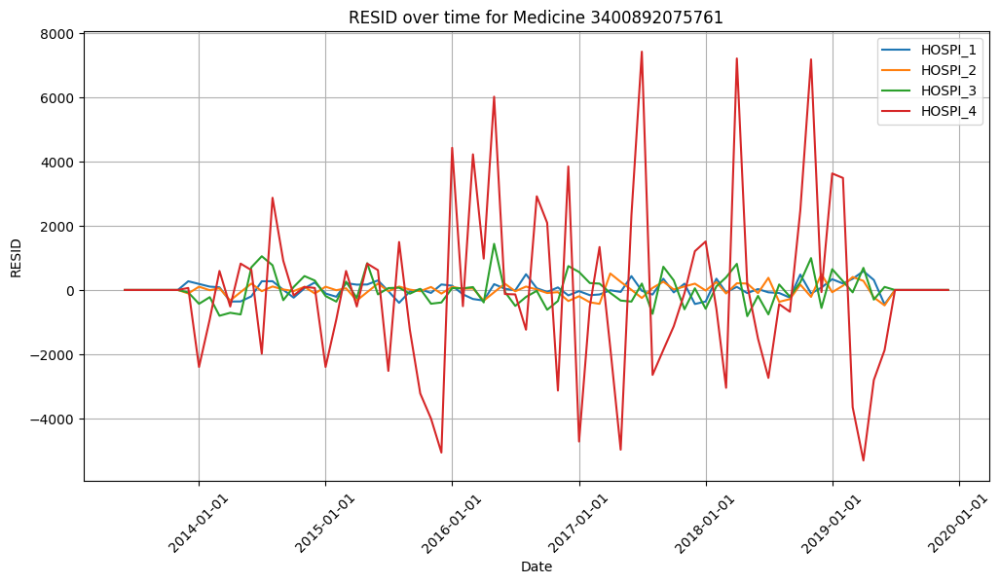

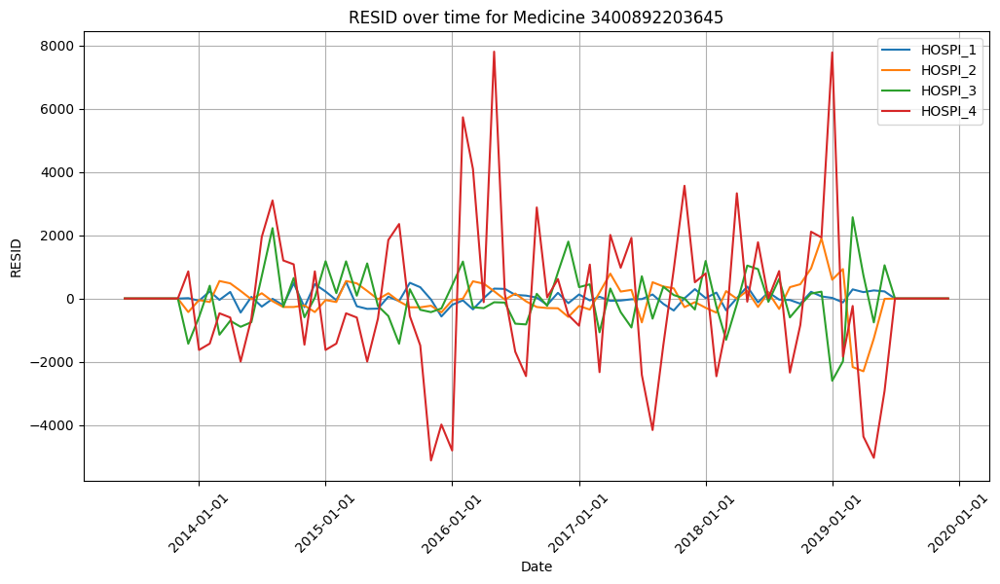

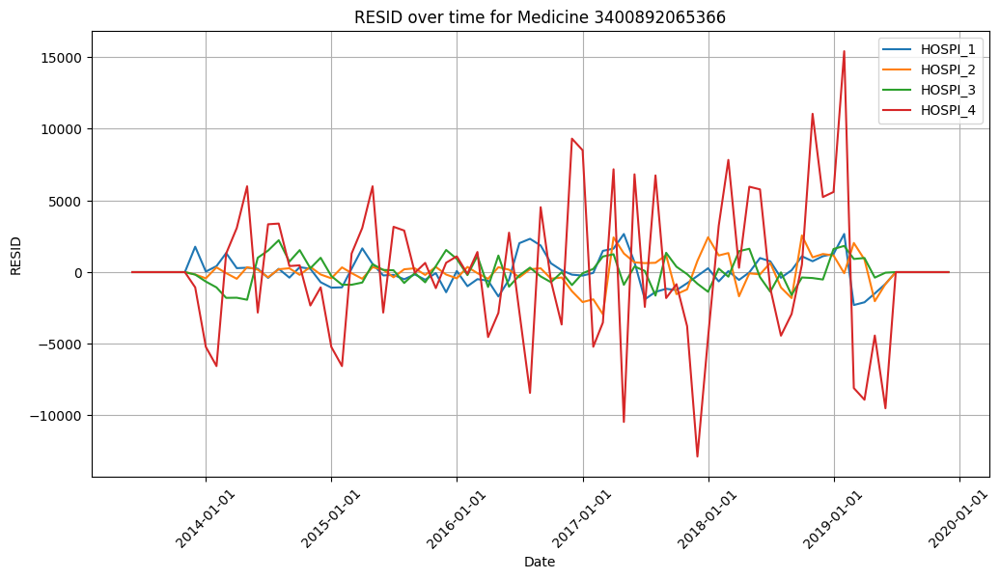

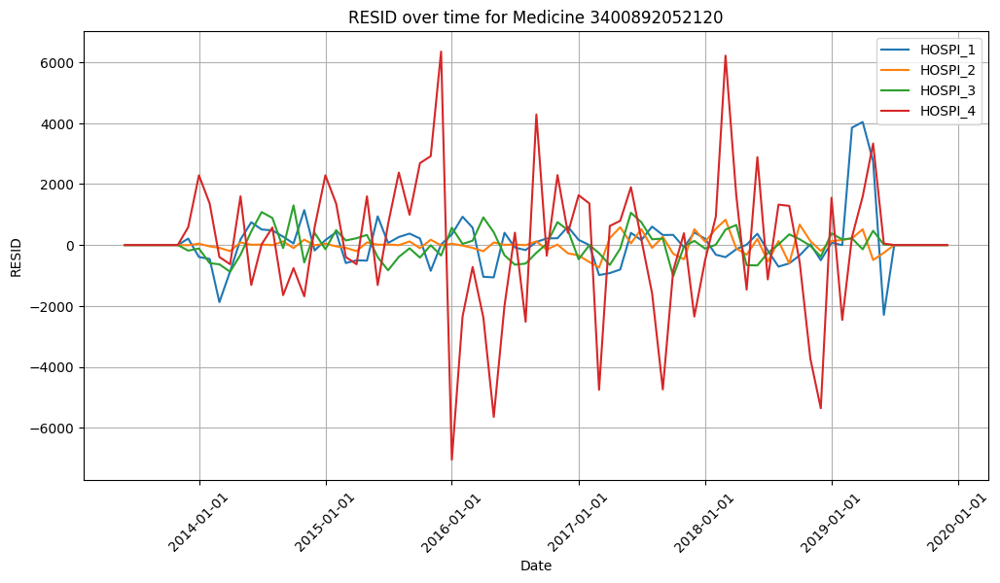

...

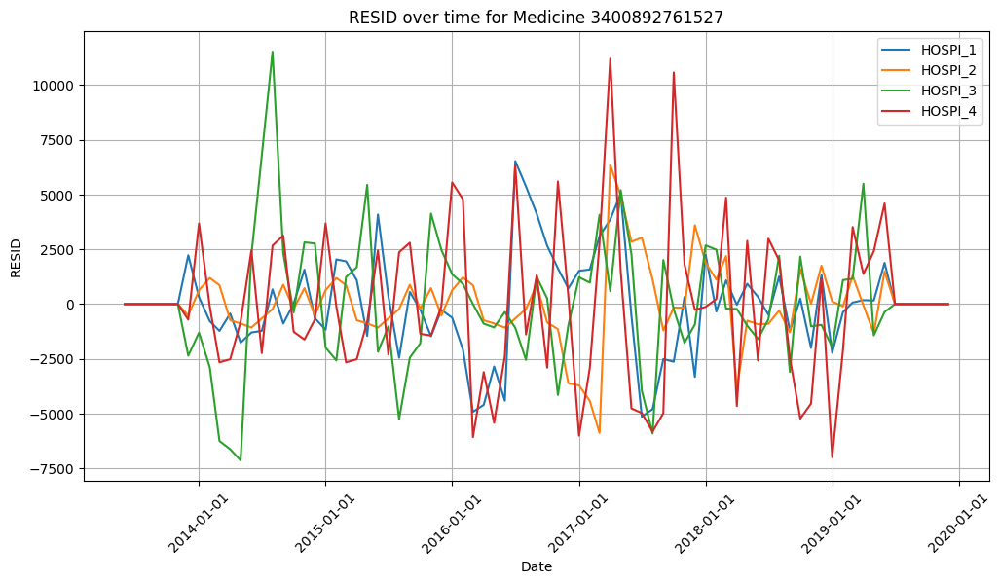

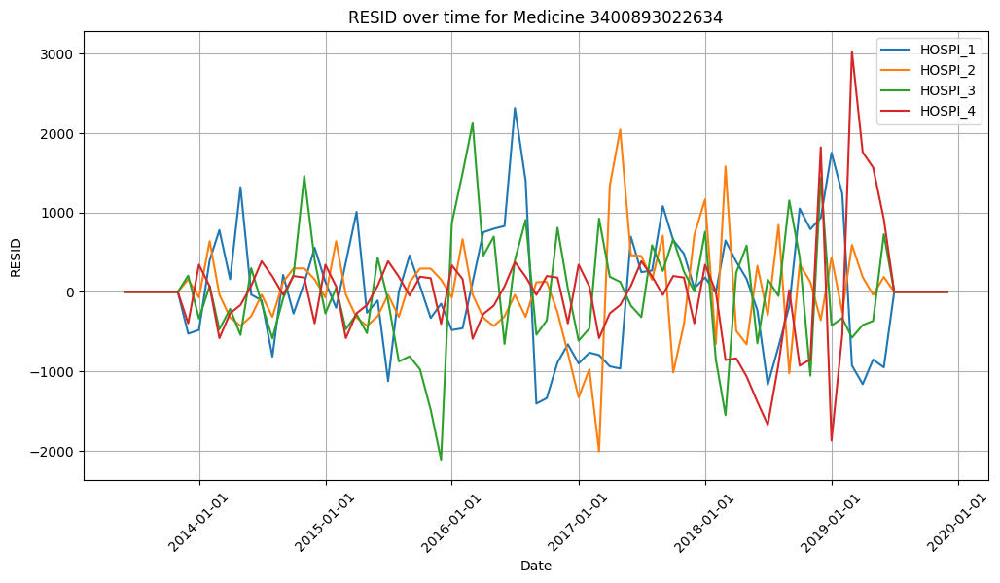

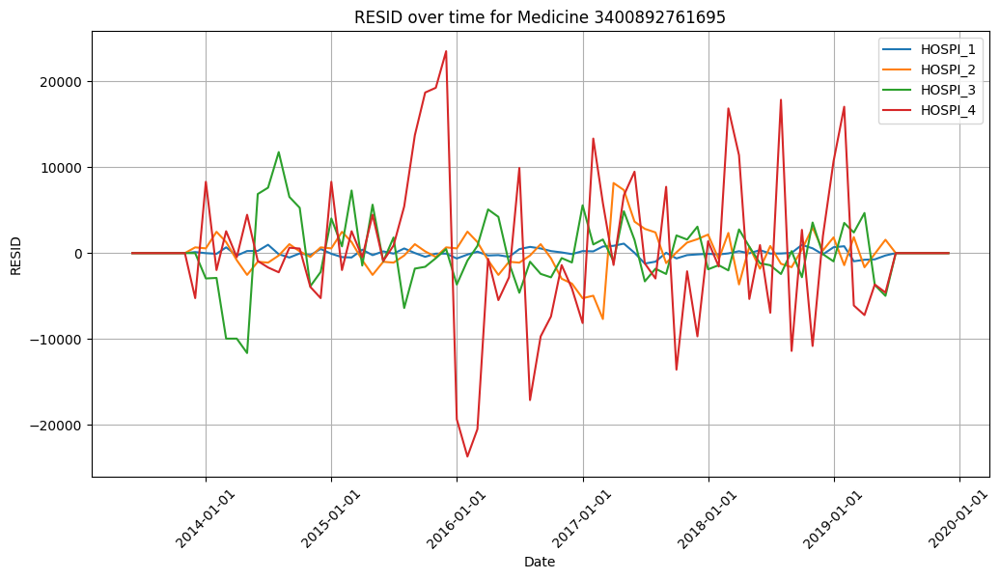

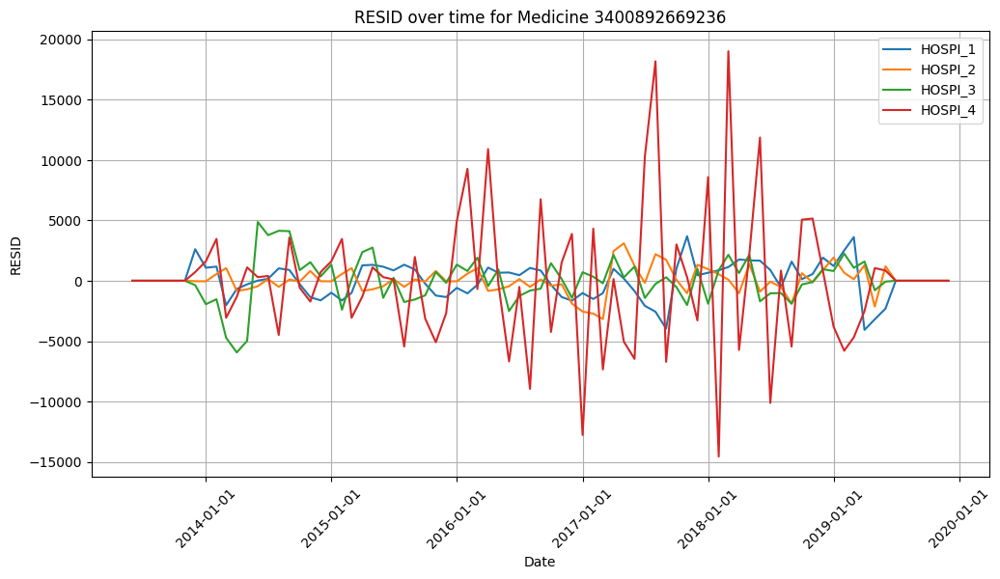

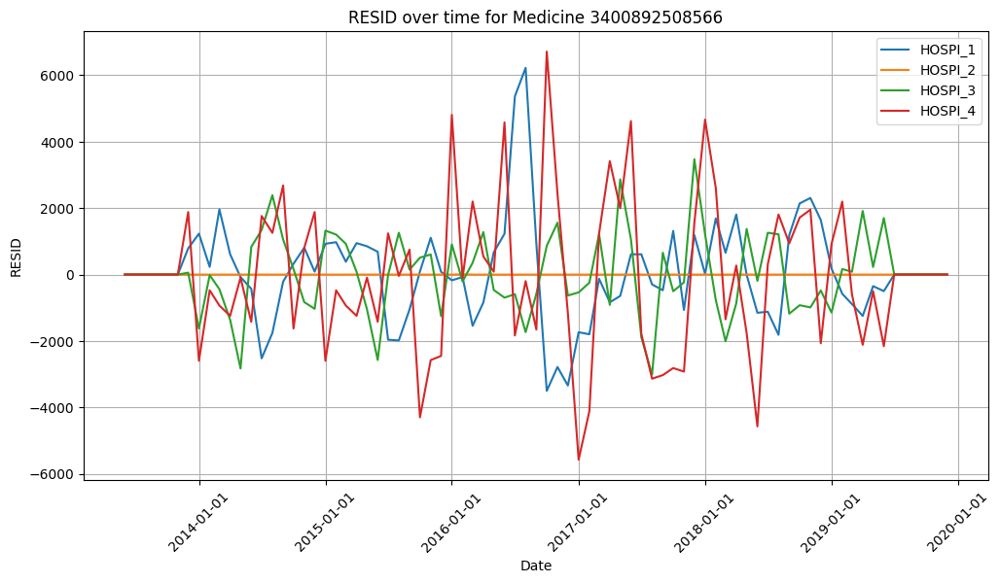

In [ ]:
plot_trend_over_time(df, medicines, "RESID")

In [35]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import pairwise_distances_argmin_min
import matplotlib.pyplot as plt
import time

def create_elbow_plot(X, max_clusters=10, sample_fraction=0.1):
    # Sample a subset of the data for faster processing (optional)
    n_samples = int(sample_fraction * len(X))
    X_sample = X[:n_samples]

    # Initialize lists to store inertia and training times
    kmeans_inertia = []
    kmeans_train_time = []
    minibatch_inertia = []
    minibatch_train_time = []

    # Perform K-means clustering for different numbers of clusters
    for n_clusters in range(1, max_clusters + 1):
        # Perform K-means clustering
        start_time = time.time()
        kmeans = KMeans(n_clusters=n_clusters,
                        init = 'k-means++',
                        n_init=1,
                        max_iter=10,
                        random_state=42)

        kmeans.fit(X_sample)
        train_time = time.time() - start_time

        # Calculate inertia (within-cluster sum of squares)
        inertia = kmeans.inertia_

        # Append inertia and training time to the respective lists
        kmeans_inertia.append(inertia)
        kmeans_train_time.append(train_time)

    # Perform Mini-Batch K-means clustering for different numbers of clusters
    for n_clusters in range(1, max_clusters + 1):
        # Perform Mini-Batch K-means clustering
        start_time = time.time()
        minibatch_kmeans = MiniBatchKMeans(n_clusters=n_clusters,
                                           init = 'k-means++',
                                           n_init=1,
                                           max_iter=10,
                                           batch_size=10,
                                           random_state=42)
        minibatch_kmeans.fit(X_sample)
        train_time = time.time() - start_time

        # Calculate inertia (within-cluster sum of squares)
        distances = pairwise_distances_argmin_min(X_sample, minibatch_kmeans.cluster_centers_)
        minibatch_inertia.append(sum(distances[1]))

        # Append inertia and training time to the respective lists
        minibatch_train_time.append(train_time)

    # Create the plots
    plt.figure(figsize=(12, 5))

    # Elbow plot
    plt.subplot(1, 2, 1)
    plt.plot(range(1, max_clusters + 1), kmeans_inertia, marker='o', label='K-means')
    plt.plot(range(1, max_clusters + 1), minibatch_inertia, marker='o', label='Mini-Batch K-means')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Plot for K-means and Mini-Batch K-means')
    plt.grid(True)
    plt.legend()

    # Training time plot
    plt.subplot(1, 2, 2)
    plt.plot(range(1, max_clusters + 1), kmeans_train_time, marker='o', label='K-means')
    plt.plot(range(1, max_clusters + 1), minibatch_train_time, marker='o', label='Mini-Batch K-means')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Training Time (seconds)')
    plt.title('Training Time for K-means and Mini-Batch K-means')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


In [36]:
def kmeans_clustering(X, n_clusters=2):
    model = KMeans(n_clusters=n_clusters,
                   init = 'k-means++',
                   n_init=1,
                   max_iter=10,
                   random_state=42)
    model.fit(X)
    return model

In [37]:
from sklearn.cluster import MiniBatchKMeans

def minibatch_kmeans_clustering(X, n_clusters=2):
    model = MiniBatchKMeans(n_clusters=n_clusters,
                            init='k-means++',
                            n_init=1,
                            batch_size=10,
                            max_iter=10,
                            random_state=42)
    model.fit(X)
    return model

In [38]:
def evaluate_kmeans_clustering(X_train, X_test, n_clusters=2, metric='euclidean', verbose = False, algorithm = 'k-means'):

    if algorithm == 'k-means':
      model = kmeans_clustering(X_train, n_clusters)

    elif algorithm == 'mini-batch':
      model = minibatch_kmeans_clustering(X_train, n_clusters)

    y_pred = model.predict(X_test)

    silhouette = metrics.silhouette_score(X_test, y_pred, metric=metric)
    davies_bouldin = metrics.davies_bouldin_score(X_test, y_pred)

    if verbose:
      metrics_string = '#'*10+' Metrics for test split - '+f'{n_clusters} clusters '+'#'*10
      print()
      print('#'*len(metrics_string))
      print(metrics_string)
      print()
      print(f'Silhouette Score: {round(silhouette, 2)}')
      print(f'Davies-Bouldin Score: {round(davies_bouldin, 2)}')
      print()
      print('#'*len(metrics_string))
      print('#'*len(metrics_string))
      print()

    return silhouette, davies_bouldin

In [39]:
df_encoded = pd.get_dummies(df, columns=['ID_SITE_RATTACHE'])
#df_encoded = pd.get_dummies(df_encoded, columns=['HOSPI_CODE_UCD'])

In [40]:
X = df_encoded.drop(['DATE', 'HOSPI_CODE_UCD'], axis = 1).copy().values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test = train_test_split(X, test_size = 0.2, random_state=42, shuffle = False)

In [41]:
def visualize_kmeans_clustering_metrics(min_clusters, max_clusters, s_scores, dbs_scores):

  # Find optimal cluster numbers based on the scores
  s_max = np.argmax(s_scores)+2
  dbs_min = np.argmin(dbs_scores)+2

  # Print the best scores and cluster numbers
  string_array = '#'*10 + ' Metrics best performance for different clusters ' + '#'*10
  len_string_array = len(string_array)
  print('-' * len_string_array)
  print('-' * len_string_array)
  print()
  print(string_array)
  print(f'Best score for Silhouette metric: {max(s_scores):.2f} for {s_max} clusters')
  print(f'Best score for Davies Bouldin metric: {min(dbs_scores):.2f} for {dbs_min} clusters')
  print()
  print('-' * len_string_array)
  print('-' * len_string_array)
  print()

  # Plot Silhouette scores
  x = np.arange(min_clusters, max_clusters+1)
  fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 6))

  # Plot Silhouette scores
  axs[0].stem(x, s_scores, linefmt='C0-', markerfmt='C0o', basefmt=' ')
  axs[0].set_xlabel('Number of Clusters')
  axs[0].set_ylabel('Silhouette Score')
  axs[0].set_title('Silhouette Scores for Different Cluster Numbers')
  axs[0].set_xticks(np.arange(2, max_clusters+1, 1))
  axs[0].set_ylim([0, 1])
  axs[0].grid(True)

  # Plot Davies Bouldin Scores
  axs[1].stem(x, dbs_scores, linefmt='C1-', markerfmt='C1o', basefmt=' ')
  axs[1].set_xlabel('Number of Clusters')
  axs[1].set_ylabel('Davies Bouldin Score')
  axs[1].set_title('Davies Bouldin Scores for Different Cluster Numbers')
  axs[1].set_xticks(np.arange(2, max_clusters+1, 1))
  axs[1].set_ylim([0, 1])
  axs[1].grid(True)

  plt.show()

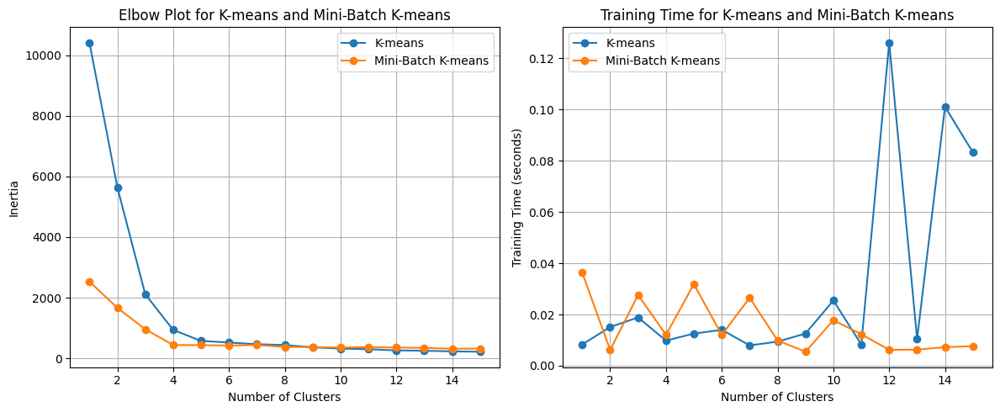

In [42]:
create_elbow_plot(X_scaled, max_clusters=15, sample_fraction=0.1)

---------------------------------------------------------------------
---------------------------------------------------------------------

########## Metrics best performance for different clusters ##########
Best score for Silhouette metric: 0.94 for 3 clusters
Best score for Davies Bouldin metric: 0.10 for 3 clusters

---------------------------------------------------------------------
---------------------------------------------------------------------



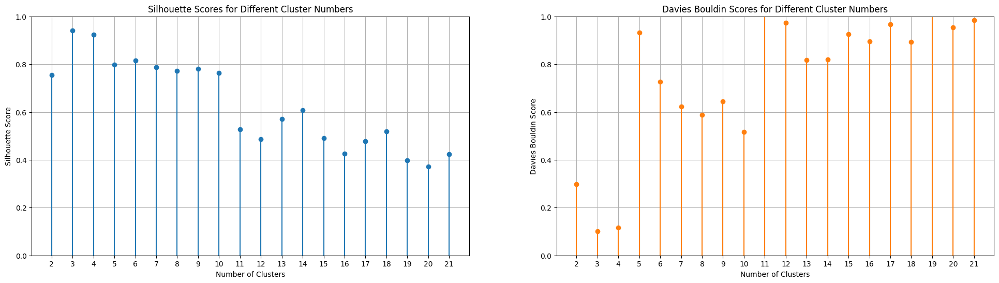

In [43]:
min_clusters = 2
max_clusters = 21

s_scores = np.zeros(max_clusters-1)
dbs_scores = np.zeros(max_clusters-1)

clusters = range(2, max_clusters + 1)

for n_clusters in clusters:

  s_scores[n_clusters-2], dbs_scores[n_clusters-2] =  evaluate_kmeans_clustering(X_train, X_test, n_clusters, algorithm = 'mini-batch')

visualize_kmeans_clustering_metrics(min_clusters, max_clusters, s_scores, dbs_scores)

In [44]:
from IPython.display import display

def model_validation(df, X, n_clusters = 2):

  model = MiniBatchKMeans(n_clusters=n_clusters,
                          init='k-means++',
                          n_init=1,
                          batch_size=10,
                          max_iter=10,
                          random_state=42)

  labels  = model.fit_predict(X)

  df['CLUSTER'] = labels

  return labels

In [45]:
import plotly.express as px

def visu_clusters(df, x1, x2, labels):
    fig = px.scatter(df, x=df[x1].astype('string'), y=df[x2], color=labels)
    fig.update_traces(marker=dict(size=5))
    fig.update_layout(
        title=f'Scatter plot of {x1} over {x2}',
        xaxis_title=x1,
        yaxis_title=x2,
        legend_title="Categories",
        xaxis_tickangle=90,
        showlegend=True
    )
    fig.show()


In [46]:
from mpl_toolkits.mplot3d import Axes3D

def visu_clusters_3d(df1, df2, df3, df4, x1, x2, labels1, labels2, labels3, labels4):
    fig = plt.figure(figsize=(24, 18))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for Hospital 1
    ax.scatter(df1[x1].astype('string'), np.ones(len(df1)), df1[x2], c=labels1, s=5, cmap='rainbow')

    # Scatter plot for Hospital 2
    ax.scatter(df2[x1].astype('string'), 2 * np.ones(len(df2)), df2[x2], c=labels2, s=5, cmap='rainbow')

    # Scatter plot for Hospital 3
    ax.scatter(df3[x1].astype('string'), 3 * np.ones(len(df3)), df3[x2], c=labels3, s=5, cmap='rainbow')

    # Scatter plot for Hospital 4
    ax.scatter(df4[x1].astype('string'), 4 * np.ones(len(df4)), df4[x2], c=labels4, s=5, cmap='rainbow')

    # Set labels and title
    ax.set_xlabel(x1)
    ax.set_ylabel('Hospital')
    ax.set_zlabel(x2)
    ax.set_title('3D Scatter Plot')

    # Set y-ticks and labels for hospitals
    ax.set_yticks([1, 2, 3, 4])
    ax.set_yticklabels(['Hospital 1', 'Hospital 2', 'Hospital 3', 'Hospital 4'])

    # Increase space between ticks and axis label
    ax.tick_params(axis='x', rotation=90, pad=10)
    ax.tick_params(axis='y', pad=10)

    # Show the plot
    plt.show()


In [47]:
labels = model_validation(df_encoded.copy(),
                             X_scaled,
                             n_clusters = 3)

visu_clusters(df.copy(),
              'HOSPI_CODE_UCD', 'QUANTITY',
              ['cat_' + str(s) for s in labels])
df_encoded['CLUSTER'] = labels

In [56]:
df_encoded.columns

Index(['HOSPI_CODE_UCD', 'QUANTITY', 'N_UFS', 'DATE', 'N_ETB', 'POPULATION',
       'P_MEDICAL', 'PN_MEDICAL', 'LIT_HC', 'LIT_HP', 'SEJ_MCO', 'SEJ_HAD',
       'SEJ_PSY', 'SEJ_SSR', 'SEJ_SLD', 'TREND', 'SEASONAL', 'RESID',
       'ID_SITE_RATTACHE_HOSPI_1', 'ID_SITE_RATTACHE_HOSPI_2',
       'ID_SITE_RATTACHE_HOSPI_3', 'ID_SITE_RATTACHE_HOSPI_4', 'CLUSTER'],
      dtype='object')

In [62]:
def test_2_clustering(df, df_scores, medicines):
  for cluster in df.CLUSTER.unique():
    print()
    print('-'*100)
    print(f'Cluster: {cluster}')

    X = df[df['CLUSTER'] == cluster][['HOSPI_CODE_UCD','N_UFS', 'TREND', 'SEASONAL', 'RESID']].copy().values
    y = df[df['CLUSTER'] == cluster]['QUANTITY'].copy().values

    # Perform the train-test split with shuffled samples
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                      test_size = .2,
                                                      random_state = 42)
    print(f'Size of data set: {len(X)}')
    print(f'Size of training set: {len(X_train)}')


    df_test = pd.DataFrame(X_test, columns = ['HOSPI_CODE_UCD','N_UFS', 'TREND', 'SEASONAL', 'RESID'])
    df_test['QUANTITY'] = y_test

    # Define the parameter distributions for RandomizedSearchCV
    param_grid = {
        'max_depth': np.arange(2, 6, 1),
        'n_estimators': np.arange(2, max(int(m.ceil(len(X_train)*0.1)),2), 1),
        'max_features': ['sqrt']
    }
    depth_len = param_grid['max_depth'].size
    estimators_len = param_grid['n_estimators'].size

    print(f'Size of grid search: {depth_len * estimators_len}')

    # Create the RandomizedSearchCV object
    grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                              param_grid=param_grid,
                              scoring = 'r2',
                              cv = 5,
                              n_jobs = -1,
                              verbose = 3)

    ''' >3 : the fold and candidate parameter indexes
        are also displayed together with the starting time of the computation.
    '''

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train[:, 1:])

    # Start the timer
    start_time = time.time()

    # Fit the RandomizedSearchCV object to the data
    grid_search.fit(X_train_scaled, y_train)
    print("Finished training")

    # End the timer
    end_time = time.time()

    # Calculate the elapsed time
    elapsed_time = end_time - start_time

    # Print the elapsed time
    print(f"Elapsed time: {elapsed_time} seconds")

    # Get the best estimator
    best_estimator = grid_search.best_estimator_
    scaler = StandardScaler()

    for medicine in df_test.HOSPI_CODE_UCD.unique():

      X_test_medicine = df_test[df_test['HOSPI_CODE_UCD'] == medicine].drop(['QUANTITY'], axis=1).copy().values
      print(f'Size of test set: {len(X_test_medicine)}')

      X_test_scaled = scaler.fit_transform(X_test_medicine[:, 1:])

      y_test_medicine = df_test[df_test['HOSPI_CODE_UCD'] == medicine]['QUANTITY'].copy().values

      # Make predictions using the best estimator
      y_pred = best_estimator.predict(X_test_scaled)

      # Calculate R^2 score
      r2 = r2_score(y_test_medicine, y_pred)

      # Calculate MAE
      mae = mean_absolute_error(y_test_medicine, y_pred)

      # Calculate MAPE
      mape = mean_absolute_percentage_error(y_test_medicine, y_pred)

      # Calculate RMSE
      rmse = np.sqrt(mean_squared_error(y_test_medicine, y_pred))

      # Print the best parameters, best score, and evaluation metrics
      print('Medicine:' + str(int(medicine)))
      print('Best Parameters:', grid_search.best_params_)
      print('Training Score: R^2', round(grid_search.best_score_, 3))
      print('Test score: ')
      print('R^2 Score:', round(r2, 3))
      print('MAE:', round(mae, 3))
      print('MAPE:', round(mape, 3))
      print('RMSE:', round(rmse, 3))
      print()


      # Create the new row as a DataFrame
      new_row = pd.DataFrame({'HOSPI_CODE_UCD': ['CODE_UCD_'+str(int(medicine))],
                              'CLUSTER': [cluster],
                              'R2': [r2],
                              'RMSE': [rmse],
                              'MAE': [mae],
                              'MAPE': [mape]})

      # Append the new row to the DataFrame
      df_scores = pd.concat([df_scores, new_row], ignore_index=True)

  # Return the updated DataFrame
  return df_scores

In [63]:
labels = model_validation(df_encoded.copy(),
                             X_scaled,
                             n_clusters = 3)

df_encoded['CLUSTER'] = labels

df_prediction_scores = pd.DataFrame(columns=[ 'HOSPI_CODE_UCD', 'CLUSTER', 'R2', 'RMSE', 'MAE', 'MAPE'])

df_prediction_scores = test_2_clustering(df_encoded, df_prediction_scores, medicines)

df_prediction_scores
df_prediction_scores.to_csv('prediction_scores_3_clusters.csv')


----------------------------------------------------------------------------------------------------
Cluster: 2
Size of data set: 3318
Size of training set: 2654
Size of grid search: 1056
Fitting 5 folds for each of 1056 candidates, totalling 5280 fits
Finished training
Elapsed time: 1379.6895005702972 seconds
Size of test set: 27
Medicine:3400892761695
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 159}
Training Score: R^2 0.96
Test score: 
R^2 Score: 0.487
MAE: 2809.211
MAPE: 1.864
RMSE: 4967.505

Size of test set: 38
Medicine:3400891996128
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 159}
Training Score: R^2 0.96
Test score: 
R^2 Score: -1.064
MAE: 37129.321
MAPE: 0.819
RMSE: 44588.844

Size of test set: 26
Medicine:3400893826706
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 159}
Training Score: R^2 0.96
Test score: 
R^2 Score: -14.783
MAE: 4831.229
MAPE: 1.666
RMSE: 6470.666

Size of test set: 35
M

In [64]:
labels = model_validation(df_encoded.copy(),
                             X_scaled,
                             n_clusters = 4)

df_encoded['CLUSTER'] = labels

df_prediction_scores = pd.DataFrame(columns=[ 'HOSPI_CODE_UCD', 'CLUSTER', 'R2', 'RMSE', 'MAE', 'MAPE'])

df_prediction_scores = test_2_clustering(df_encoded, df_prediction_scores, medicines)

df_prediction_scores
df_prediction_scores.to_csv('prediction_scores_4_clusters.csv')


----------------------------------------------------------------------------------------------------
Cluster: 3
Size of data set: 1659
Size of training set: 1327
Size of grid search: 524
Fitting 5 folds for each of 524 candidates, totalling 2620 fits
Finished training
Elapsed time: 281.3990857601166 seconds
Size of test set: 16
Medicine:3400892745848
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 122}
Training Score: R^2 0.977
Test score: 
R^2 Score: 0.842
MAE: 1397.736
MAPE: 0.192
RMSE: 1887.153

Size of test set: 20
Medicine:3400892761695
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 122}
Training Score: R^2 0.977
Test score: 
R^2 Score: -50.614
MAE: 5671.586
MAPE: 2.193
RMSE: 6675.106

Size of test set: 27
Medicine:3400892203645
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 122}
Training Score: R^2 0.977
Test score: 
R^2 Score: -307.2
MAE: 6936.91
MAPE: 4.26
RMSE: 8048.844

Size of test set: 13
Medic

In [ ]:
labels = model_validation(df_encoded.copy(),
                             X_scaled,
                             n_clusters = 5)

df_encoded['CLUSTER'] = labels

df_prediction_scores = pd.DataFrame(columns=[ 'HOSPI_CODE_UCD', 'CLUSTER', 'R2', 'RMSE', 'MAE', 'MAPE'])

df_prediction_scores = test_2_clustering(df_encoded, df_prediction_scores, medicines)

df_prediction_scores
df_prediction_scores.to_csv('prediction_scores_5_clusters.csv')


----------------------------------------------------------------------------------------------------
Cluster: 3
Size of data set: 1659
Size of training set: 1327
Size of grid search: 524
Fitting 5 folds for each of 524 candidates, totalling 2620 fits
Finished training
Elapsed time: 281.51242423057556 seconds
Size of test set: 16
Medicine:3400892745848
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 122}
Training Score: R^2 0.977
Test score: 
R^2 Score: 0.842
MAE: 1397.736
MAPE: 0.192
RMSE: 1887.153

Size of test set: 20
Medicine:3400892761695
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 122}
Training Score: R^2 0.977
Test score: 
R^2 Score: -50.614
MAE: 5671.586
MAPE: 2.193
RMSE: 6675.106

Size of test set: 27
Medicine:3400892203645
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 122}
Training Score: R^2 0.977
Test score: 
R^2 Score: -307.2
MAE: 6936.91
MAPE: 4.26
RMSE: 8048.844

Size of test set: 13
Medi

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning:

R^2 score is not well-defined with less than two samples.



Medicine:3400891235203
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 43}
Training Score: R^2 0.808
Test score: 
R^2 Score: 0.544
MAE: 1550.548
MAPE: 1.084
RMSE: 1768.025

Size of test set: 13
Medicine:3400892697789
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 43}
Training Score: R^2 0.808
Test score: 
R^2 Score: -47.668
MAE: 3899.579
MAPE: 1.239
RMSE: 5112.884

Size of test set: 10
Medicine:3400891191226
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 43}
Training Score: R^2 0.808
Test score: 
R^2 Score: -0.1
MAE: 1464.998
MAPE: 0.174
RMSE: 2070.943

Size of test set: 10
Medicine:3400893736135
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 43}
Training Score: R^2 0.808
Test score: 
R^2 Score: 0.243
MAE: 1459.827
MAPE: 0.214
RMSE: 1833.825

Size of test set: 3
Medicine:3400892761695
Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 43}
Training Score: R^2

In [ ]:
labels = model_validation(df_encoded.copy(),
                             X_scaled,
                             n_clusters = 6)

df_encoded['CLUSTER'] = labels

df_prediction_scores = pd.DataFrame(columns=[ 'HOSPI_CODE_UCD', 'CLUSTER', 'R2', 'RMSE', 'MAE', 'MAPE'])

df_prediction_scores = test_2_clustering(df_encoded, df_prediction_scores, medicines)

df_prediction_scores
df_prediction_scores.to_csv('prediction_scores_6_clusters.csv')

In [ ]:
labels = model_validation(df_encoded.copy(),
                             X_scaled,
                             n_clusters = 7)

df_encoded['CLUSTER'] = labels

df_prediction_scores = pd.DataFrame(columns=[ 'HOSPI_CODE_UCD', 'CLUSTER', 'R2', 'RMSE', 'MAE', 'MAPE'])

df_prediction_scores = test_2_clustering(df_encoded, df_prediction_scores, medicines)

df_prediction_scores
df_prediction_scores.to_csv('prediction_scores_7_clusters.csv')